# DM2425 - EXPLORATORY DATA ANALYSIS NOTEBOOK

### GROUP 24 <br>
Carolina Pinto - 20240494 <br>
Francisco Pontes - 20211583 <br>
Iris Moreira - 20240659 <br>
Maria Margarida Cardoso - 20240493 <br>

## Table of Contents
- [1. IMPORT LIBRARIES](#1-import-libraries)
- [2. READING THE DATA](#2-reading-the-data)
- [3. DATA EXPLORATION](#3-data-exploration)
    - [3.1. DATA TYPES AND MINIMAL PREPROCESSING](#31-data-types-and-minimal-preprocessing)
        - [3.1.1. CATEGORICAL FEATURES](#311-categorical-features)
            - [3.1.1.1. VISUALIZATIONS](#3111-visualizations)
            - [3.1.1.2. INTERPRETATIONS](#3112-interpretations)
        - [3.1.2. NUMERICAL FEATURES](#312-numerical-features)
            - [3.1.2.1. VISUALIZATIONS](#3121-visualizations)
            - [3.1.2.2. INTERPRETATIONS](#3122-interpretations)
    - [3.2. MISSING VALUES AND OUTLIERS](#32-missing-values-and-outliers)
        - [3.2.1. MISSING VALUES](#321-missing-values)
            - [3.2.1.1. MISSING VALUES ON HR_0](#3211-missing-values-on-hr_0)
            - [3.2.1.2. MISSING VALUES ON FIRST ORDER](#3212-missing-values-on-first_order)
        - [3.2.2. OUTLIERS](#322-outliers)
        - [3.2.3. CONCLUSIONS](#323-conclusions)
    - [3.3. ANOMALIES](#33-anomalies)
        - [3.3.1. product_count and vendor_count](#331-product_count-and-vendor_count)
        - [3.3.2. is_chain](#332-is_chain)
        - [3.3.3. CUI](#333-cui)
    - [3.4. MULTIVARIATE ANALYSIS](#34-multivariate-analysis)
        - [3.4.1. RELATIONSHIPS BETWEEN CATEGORICAL AND NUMERICAL FEATURES](#341-relationships-between-categorical-and-numerical-features)
        - [3.4.2. RELATIONSHIPS BETWEEN CATEGORICAL FEATURES](#342-relationships-between-categorical-features)
        - [3.4.3 RELATIOSHIPS BETWEEN NUMERICAL FEATURES](#343-relationships-between-numerical-features)
- [4. NEW FEATURES/FEATURE ENGINEERING](#4-new-featuresfeature-engineering)
    - [4.1. AGREGATING FEATURES](#41-agregating-features)
    - [4.2. CREATING NEW FEATURES](#42-creating-new-features)
    - [4.3. VISUALIZATIONS WITH THE NEW FEATURES](#43-visualizations-with-the-new-features)
- [5. FINAL CONCLUSIONS](#5-final-conclusions)


## 1. IMPORT LIBRARIES

In [261]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from math import ceil

## 2. READING THE DATA

In [262]:
data = pd.read_csv(r'DM2425_ABCDEats_DATASET.csv')
data

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,...,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,...,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,...,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,...,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31883,f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,...,0,0,0,0,0,0,0,0,0,0
31884,f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,...,0,0,1,0,0,0,0,0,0,0
31885,f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,...,0,0,0,0,0,0,0,0,0,0
31886,f7b19c0241,8670,34.0,1,1,0,NaN,0,DISCOUNT,DIGI,...,0,0,0,0,0,0,0,0,0,0


## 3. DATA EXPLORATION


### Dataset Description <br>
The dataset provided for this project includes customer data from ABCDEats Inc. The data consists of multiple
columns capturing various customer attributes and aggregating their behaviour over a three-month period.
Each row corresponds to one customer, and the column descriptions are given below:


### METADATA
1 customer_id Unique identifier for each customer. <br>
2 customer_region Geographic region where the customer is located. <br>
3 customer_age Age of the customer. <br>
4 vendor_count Number of unique vendors the customer has ordered from.<br>
5 product_count Total number of products the customer has ordered. <br>
6 is_chain Indicates whether the customer’s order was from a chain restaurant.<br>
7 first_order Number of days from the start of the dataset when the customer first
placed an order.<br>
8 last_order Number of days from the start of the dataset when the customer most
recently placed an order.<br>
9 last_promo The category of the promotion or discount most recently used by the
customer.<br>
10 payment_method Method most recently used by the customer to pay for their orders.<br>
11 CUI_American,
CUI_Asian,
CUI_Chinese,
CUI_Italian, etc.
The amount in monetary units spent by the customer from the indicated type of cuisine.<br>
12 DOW_0 to DOW_6 Number of orders placed on each day of the week
(0 = Sunday, 6 = Saturday).<br>
13 HR_0 to HR_23 Number of orders placed during each hour of the day
(0 = midnigh, 23 = 11 PM).<br>

In [263]:
data.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,...,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,...,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,...,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,...,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,...,0,0,0,0,0,0,0,0,0,0


In [264]:
data.tail()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31883,f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,...,0,0,0,0,0,0,0,0,0,0
31884,f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,...,0,0,1,0,0,0,0,0,0,0
31885,f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,...,0,0,0,0,0,0,0,0,0,0
31886,f7b19c0241,8670,34.0,1,1,0,NaN,0,DISCOUNT,DIGI,...,0,0,0,0,0,0,0,0,0,0
31887,fd40d3b0e0,4660,30.0,1,1,0,NaN,0,-,CASH,...,0,0,1,0,0,0,0,0,0,0


### 3.1. DATA TYPES AND MINIMAL PREPROCESSING

In [265]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31888 entries, 0 to 31887
Data columns (total 56 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               31888 non-null  object 
 1   customer_region           31888 non-null  object 
 2   customer_age              31161 non-null  float64
 3   vendor_count              31888 non-null  int64  
 4   product_count             31888 non-null  int64  
 5   is_chain                  31888 non-null  int64  
 6   first_order               31782 non-null  float64
 7   last_order                31888 non-null  int64  
 8   last_promo                31888 non-null  object 
 9   payment_method            31888 non-null  object 
 10  CUI_American              31888 non-null  float64
 11  CUI_Asian                 31888 non-null  float64
 12  CUI_Beverages             31888 non-null  float64
 13  CUI_Cafe                  31888 non-null  float64
 14  CUI_Ch

It doesn't seem to be any problem with the data types, except for the variables that should be integer (customer_age, first_order and HR_0) but them being represented as floats it's due to the presence of missing values.


The first step is to drop duplicates so we don't have double information that could be misleading.

In [266]:
data.duplicated().sum()

13

In [267]:
data.drop_duplicates(inplace=True)

In [268]:
data.set_index('customer_id', inplace=True)

We then set the index to customer_id, since it is the unique identifier for each customer and statistical interpretation of this feature is meaningless.

In [269]:
data.rename(columns={'CUI_Street Food / Snacks': 'CUI_Street Food_Snacks'}, inplace=True) #the '/' character can cause problems later in the code, so we replaced it with '_'
data

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,...,0,0,0,0,2,0,0,0,0,0
5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,...,0,0,0,0,0,0,0,0,0,0
f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,...,0,0,0,0,0,0,0,0,0,0
180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,...,1,0,0,0,0,0,0,0,0,0
4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,...,0,0,0,0,0,0,0,0,0,0
f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,...,0,0,1,0,0,0,0,0,0,0
f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,...,0,0,0,0,0,0,0,0,0,0


In [270]:
data_num = data.select_dtypes(include=[int, float])
data_cat = data.select_dtypes(include=[object])

We split our data set into numerical and categorical features, in order to do visualizations and explore in detail according to type.

In [271]:
data.shape

(31875, 55)

Without duplicate records we have 31875 observations of 55 different features

In [272]:
numeric_features = data_num.columns
categorical_features = data_cat.columns

We save the numerical and categorical features to further use for visualization purposes

In [273]:
cuisine_columns = [col for col in data.columns if col.startswith('CUI_')]
dow_columns = [col for col in data.columns if col.startswith('DOW_')]
hr_columns = [col for col in data.columns if col.startswith('HR_')]


We save the CUI, DOW and HR columns to further use for exploratory and visualization purposes

#### 3.1.1. CATEGORICAL FEATURES

In [ ]:
for i in categorical_features:
    print(f"Coluna: {i}")
    print(data_cat[i].value_counts())
    print("\n")

Coluna: customer_region
customer_region
8670    9761
4660    9550
2360    8829
2440    1483
4140     857
8370     495
2490     445
-        442
8550      13
Name: count, dtype: int64


Coluna: last_promo
last_promo
-           16744
DELIVERY     6282
DISCOUNT     4496
FREEBIE      4353
Name: count, dtype: int64


Coluna: payment_method
payment_method
CARD    20153
DIGI     6098
CASH     5624
Name: count, dtype: int64




In [275]:
data_cat.describe()

,customer_region,last_promo,payment_method
count,31875,31875,31875
unique,9,4,3
top,8670,-,CARD
freq,9761,16744,20153


##### 3.1.1.1. VISUALIZATIONS

**Pie chart** for eletronic and cash payment methods

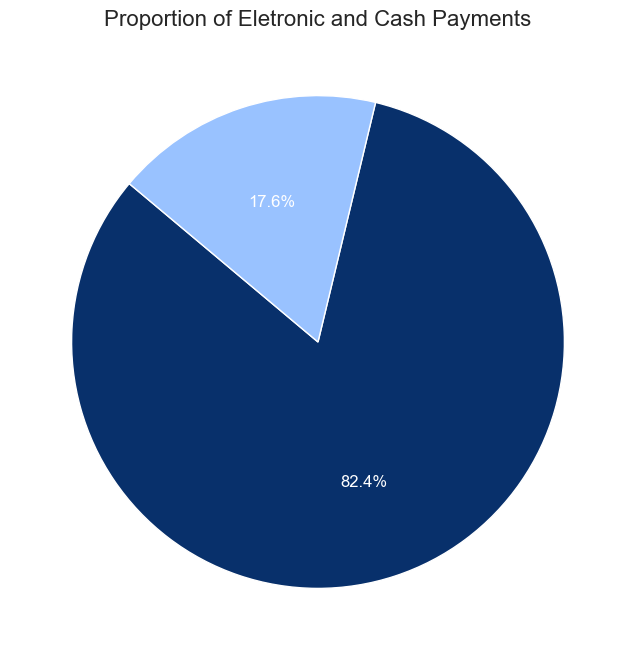

In [276]:
nr_cash=data_cat[data_cat['payment_method']=='CASH'].shape[0]
nr_card=data_cat[data_cat['payment_method']=='CARD'].shape[0]
nr_digi=data_cat[data_cat['payment_method']=='DIGI'].shape[0]

payment_data = {
    'Digital': nr_card + nr_digi,
    'Cash': nr_cash
}

colors = ['#08306b','#99c2ff', '#66b2ff', '#1f78b4']

plt.figure(figsize=(8, 8))
plt.pie(payment_data.values(), labels=payment_data.keys(), autopct='%1.1f%%', startangle=140, colors=colors, textprops={'color': 'white'})
plt.title('Proportion of Eletronic and Cash Payments', fontsize=16)
plt.show()

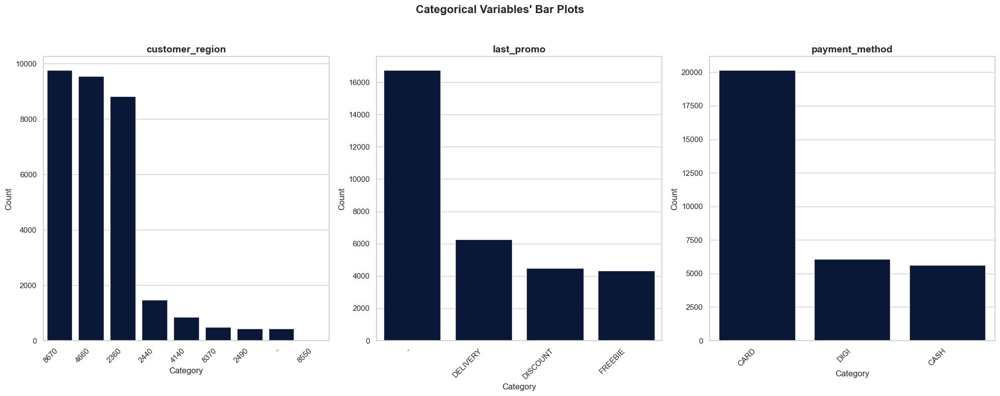

In [277]:
sns.set(style='whitegrid')

fig, axes = plt.subplots(1, len(categorical_features), figsize=(20, 8))

for ax, feat in zip(axes.flatten(), categorical_features):
    count_data = data[feat].value_counts().sort_values(ascending=False)

    sns.barplot(x=count_data.index, y=count_data.values, ax=ax, color='#01153E')

    ax.set_title(feat, fontsize=14, fontweight='bold')
    ax.set_xlabel('Category', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.suptitle("Categorical Variables' Bar Plots", fontsize=16, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.95]) 

plt.show()



##### 3.1.1.2. INTERPRETATIONS

We can now start to interpret and retrieve valuable insights from the categorical features:
1. **CUSTOMER REGION**: There are a total of 9 regions, with one region recorded as ‘-’ (1,39% of records).
We can either treat it as a missing value or assign those customers to an ‘unknown’ region or a broader region that has a similar distribution. Another option is to drop these rows since they represent a small percentage of our data set (1,39% of our observations). All regions start with either 2, 4 or 8, which most likely indicate a broader region, so it seems reasonable to assume that customers are distributed across 3 broader regions.
The majority of our customers are concentrated in: region 8670, region 4660 and region 2360.<br>


3. **LAST_PROMO** : There are 4 types of promotion, one of them labeled as ‘-’. In fact, the most frequent value, for more than half of the observations (52,5%) is ‘-’. This might indicate that the customer never used a promotion. Another possibility is that a popular promotion wasn’t properly labeled, though this seems less likely.
Our hypothesis is that promotions are either badly advertised or are available within short periods of time. Among the labeled promotions the most used one is the Delivery promotion, though the differences in usage among the other promotions are relatively small.
This suggests that the type of promotion may not be a strong indicator for distinguishing between different customer behaviors.
Given this, we could create a binary feature where 1 indicates that the customer used a promotion, and 0 indicates they did not. <br>


4. **PAYMENT_METHOD**: There are 3 types of payment methods. The most common is CARD, that represents 63,3% of the observations.  Digital payments make up 19,1%, and together with CARD, 82.3% of customers use electronic payment methods.  This aligns with the fact that the average customer age is 27.5 years, an age group more likely to favor electronic payment methods due to their widespread adoption, although older users also make a similar use of digital payments. So, independently of age, our customers prefer electronic payment methods, which proves an opportunity for digital engagement strategies .<br>


#### 3.1.2. NUMERICAL FEATURES

In [278]:
data_num.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,31148.0,27.507545,7.161828,15.0,23.0,26.0,31.00,80.00
vendor_count,31875.0,3.102714,2.771753,0.0,1.0,2.0,4.00,41.00
product_count,31875.0,5.668424,6.957933,0.0,2.0,3.0,7.00,269.00
is_chain,31875.0,2.819357,3.977977,0.0,1.0,2.0,3.00,83.00
first_order,31769.0,28.469924,24.104626,0.0,7.0,22.0,45.00,90.00
last_order,31875.0,63.672376,23.227992,0.0,49.0,70.0,83.00,90.00
CUI_American,31875.0,4.877205,11.647043,0.0,0.0,0.0,5.66,280.21
CUI_Asian,31875.0,9.955306,23.561492,0.0,0.0,0.0,11.83,896.71
CUI_Beverages,31875.0,2.298224,8.475868,0.0,0.0,0.0,0.00,229.22
CUI_Cafe,31875.0,0.801490,6.428422,0.0,0.0,0.0,0.00,326.10


In [279]:
for col in numeric_features:
    unique_vals = data_num[col].unique()
    print(f"Unique values for {col}: {unique_vals}")

Unique values for customer_age: [18. 17. 38. nan 20. 40. 24. 27. 33. 26. 21. 51. 35. 22. 31. 15. 47. 19.
 28. 32. 25. 37. 42. 48. 16. 34. 29. 23. 30. 39. 46. 41. 49. 53. 36. 43.
 44. 45. 57. 58. 68. 56. 61. 60. 54. 59. 50. 55. 52. 65. 75. 66. 79. 80.
 63. 77. 62. 69. 72. 64. 76. 74. 67. 70. 78. 71. 73.]
Unique values for vendor_count: [ 2  1  3  4  5  7  6 11  9  8 12 14 20 13 10 16 24 18 17 15 25 30 19 21
 23 22 28 32 41 40 26  0 27 34 31 35 29]
Unique values for product_count: [  5   2   3   4   6  10   8  17   7  26   9  32  15  13  16  28  19  12
  18  11  25  14  23  29  21  31  95  24  64  27  37  49  22  41  51  34
  39  20  30  47  40  53  38  54  35  33  56  65  45  63  36  79  48  70
  44  84  46  66  57  58  83 110 117 269  75  55  42  81  91  43  69  67
  72  59   1   0  77  97  87  73  76  60 109  52  62  94  80  89  61  82
  50  88  68]
Unique values for is_chain: [ 1  2  0  3  5  4  7 12  6 23  8 11 20 14  9 10 16 15 13 25 17 27 30 32
 24 18 26 28 22 40 31 39 21 37 19 33

##### 3.1.2.1. VISUALIZATIONS

**Pie chart** to check that the majority of the customers are in their tweenties.

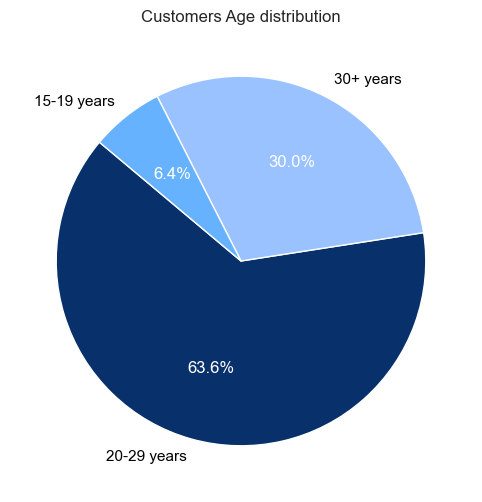

In [280]:
bins = [15, 19, 29, 80]
labels = ['15-19 years', '20-29 years', '30+ years']

data['age_group'] = pd.cut(data['customer_age'], bins=bins, labels=labels, right=True)

age_counts = data['age_group'].value_counts()

colors = ['#08306b','#99c2ff', '#66b2ff', '#1f78b4']

plt.figure(figsize=(8, 6))
plt.pie(age_counts, labels=age_counts.index, autopct='%1.1f%%', startangle=140, colors=colors, textprops={'color': 'black'})
for text in plt.gca().texts:
    if '%' in text.get_text():
        text.set_color('white')  
plt.title('Customers Age distribution')
plt.show()

data.drop(columns='age_group', inplace=True)

**Boxplot and Histograms**

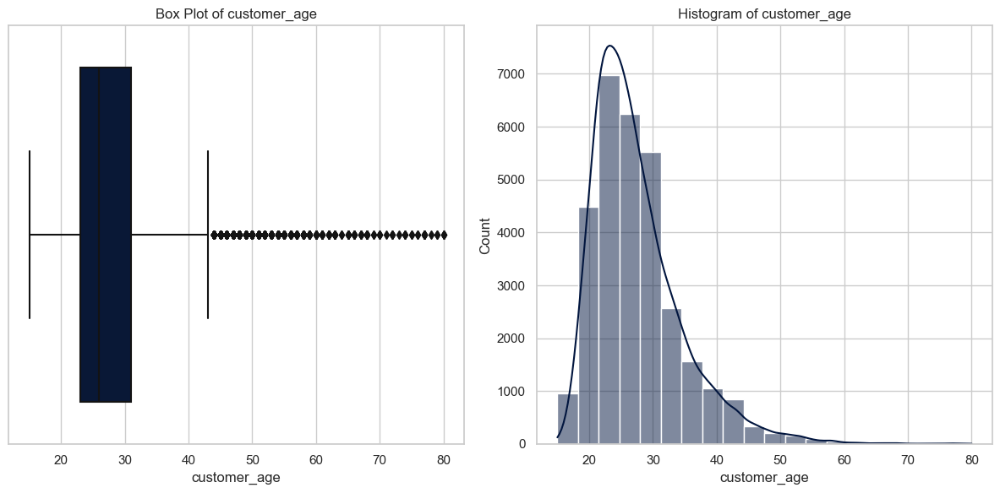

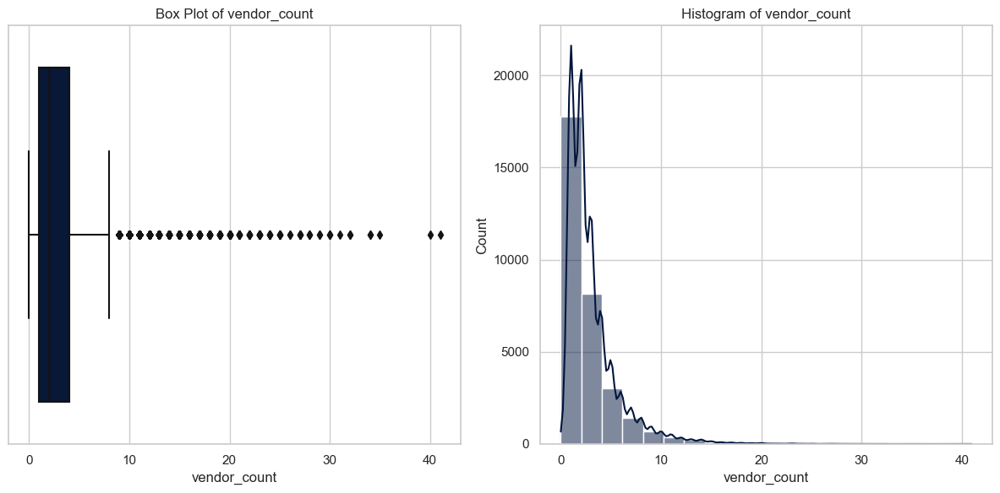

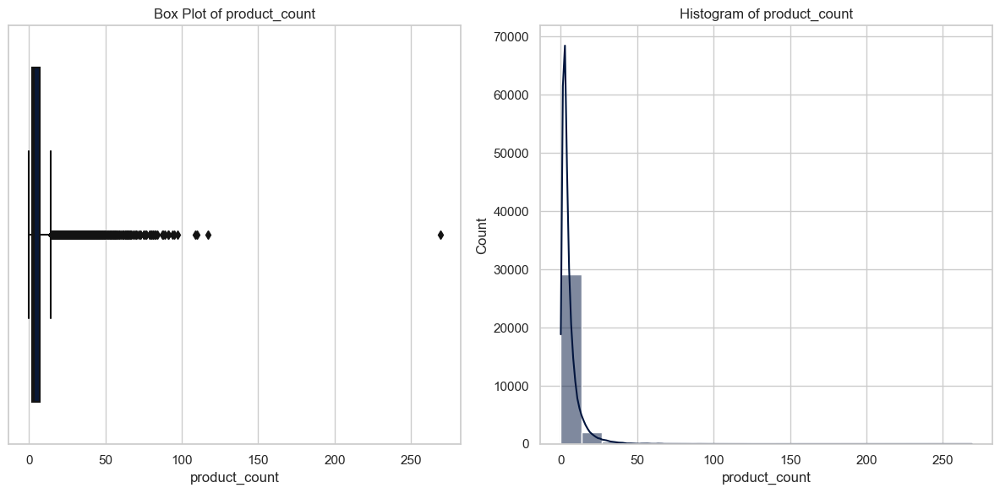

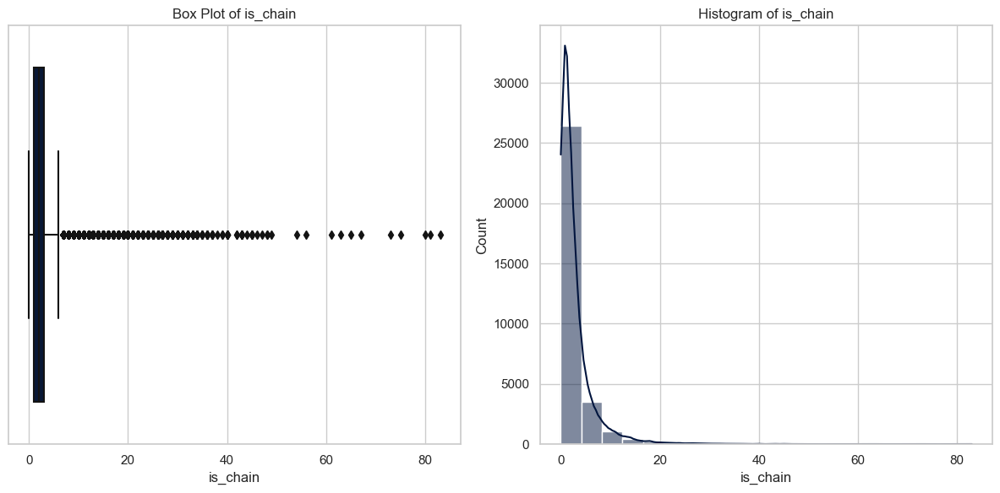

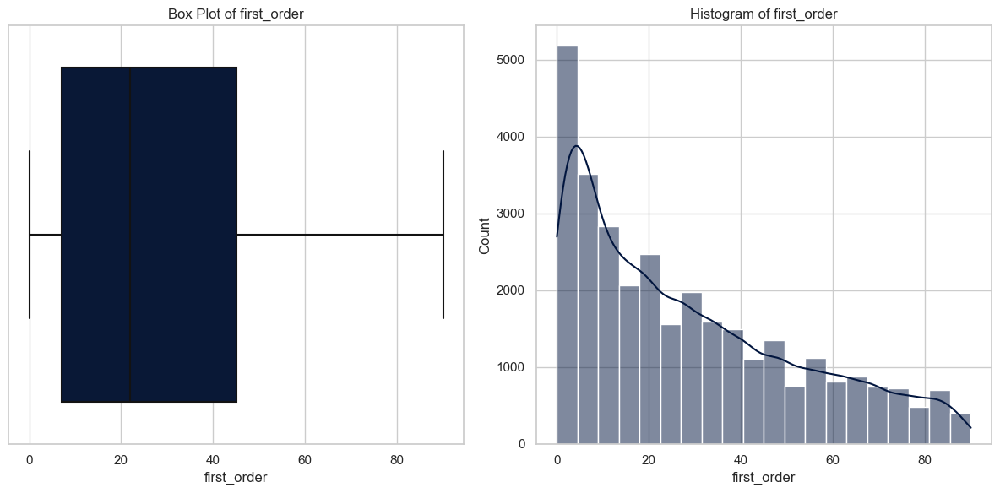

...

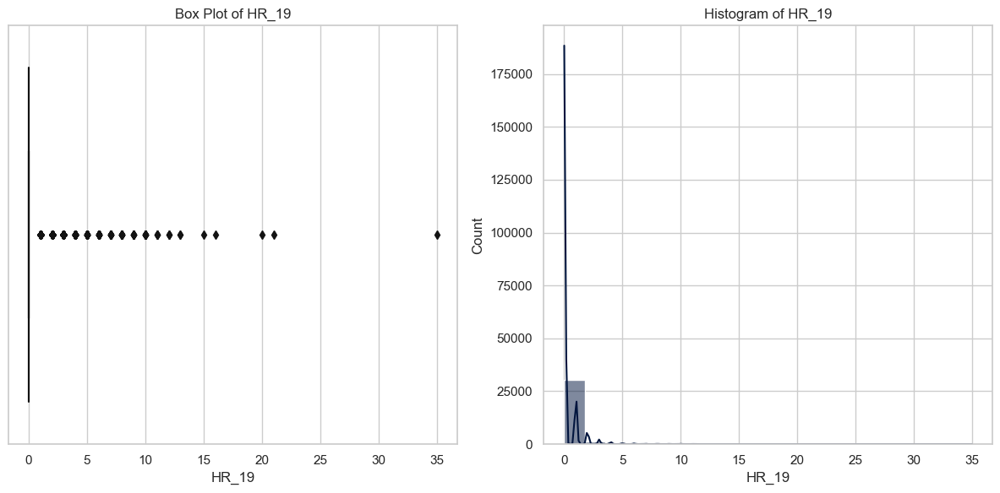

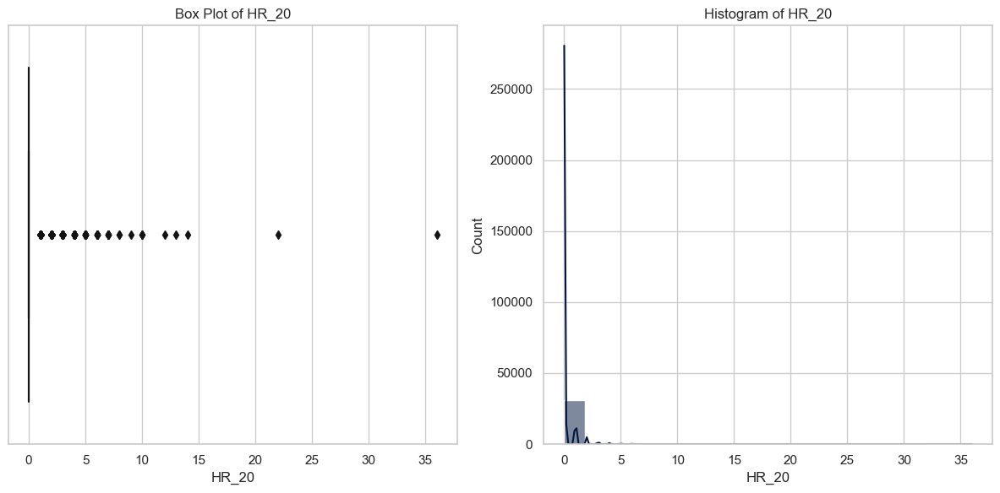

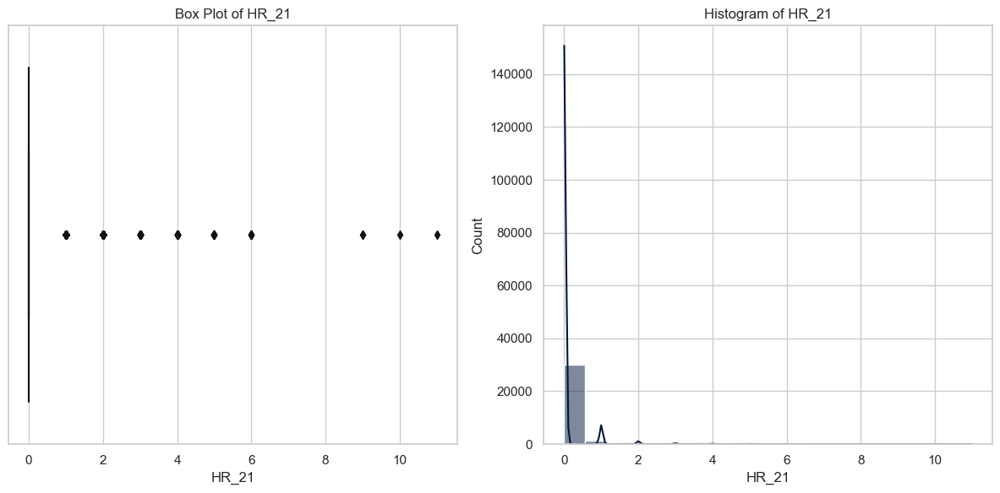

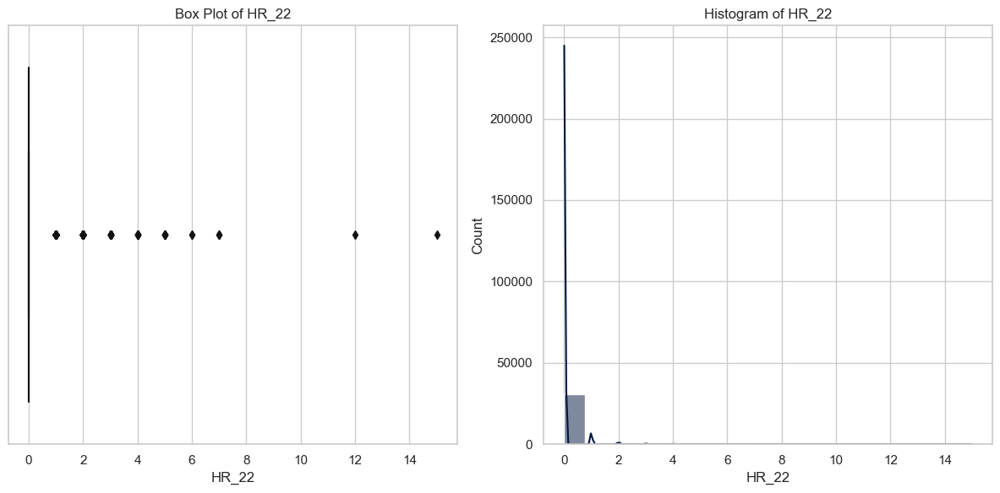

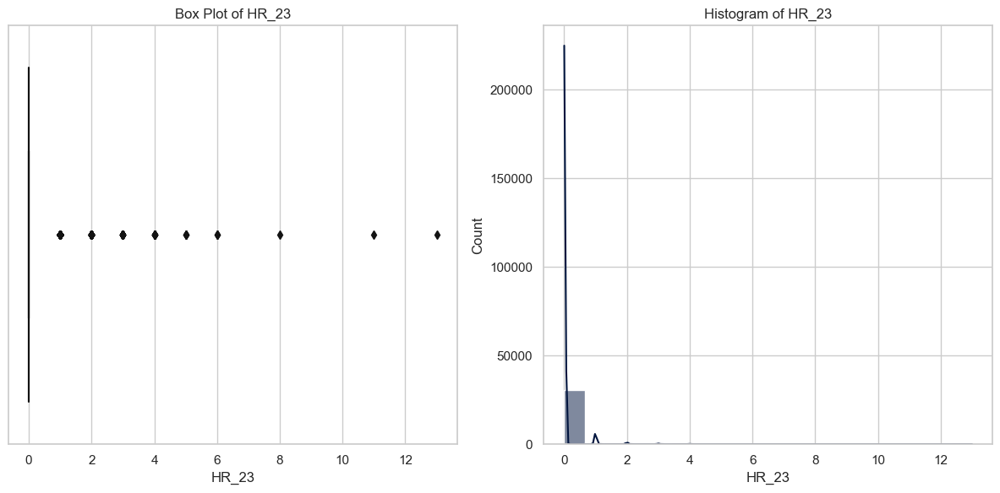

In [281]:
for column in numeric_features:
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.boxplot(x=data[column], color='#01153E')
    plt.title(f'Box Plot of {column}')

    plt.subplot(1, 2, 2)
    sns.histplot(data[column], bins=20, kde=True, color='#01153E')
    plt.title(f'Histogram of {column}')

    plt.tight_layout()

    plt.savefig(f'{column}_plot.png', format='png', dpi=300, bbox_inches='tight')

    # Show the plot
    plt.show()

We can clearly see that boxplot and histograms are not the best approach for some variables, more specifically Cuisines and Hours. This is something we were expectiong after the initial stasticial interpretation. We will now perform different visualizations for each variable according to it's context.

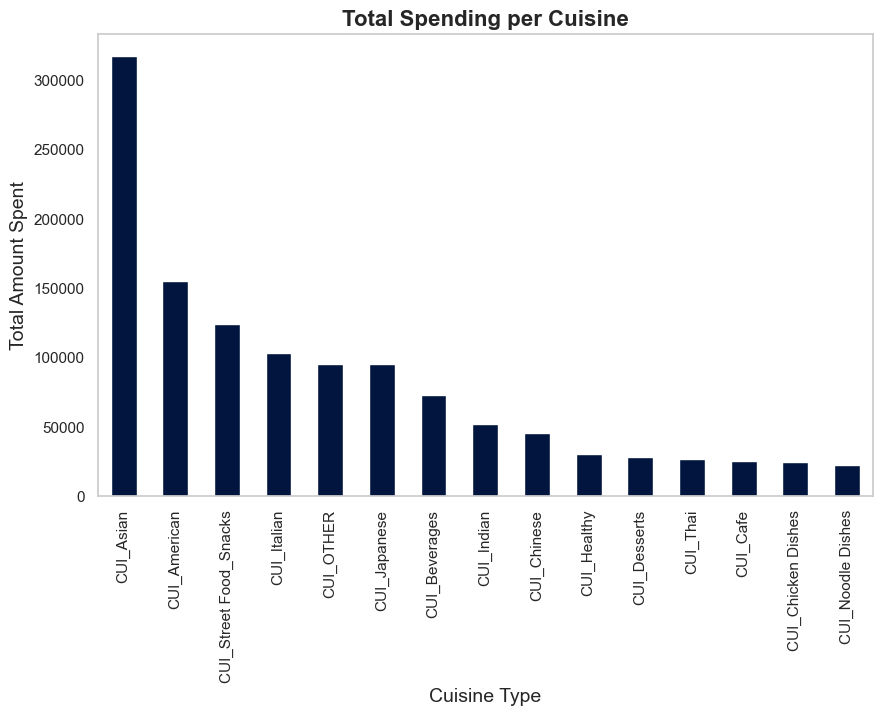

In [282]:
plt.figure(figsize=(10, 8))
cuisine_totals = data[cuisine_columns].sum()
cuisine_totals_sorted = cuisine_totals.sort_values(ascending=False)
cuisine_totals_sorted.plot(kind='bar', figsize=(10, 6), color='#01153E')
plt.title('Total Spending per Cuisine', fontsize=16, fontweight='bold', fontfamily='sans-serif')
plt.ylabel('Total Amount Spent', fontsize=14, fontfamily='sans-serif')
plt.xlabel('Cuisine Type', fontsize=14, fontfamily='sans-serif')
plt.grid(False)
plt.show()

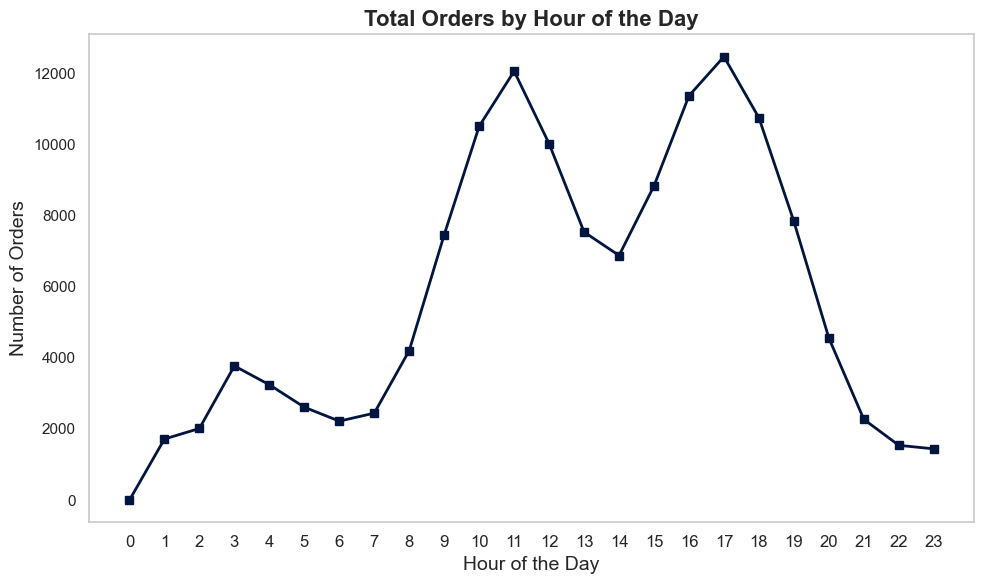

In [283]:
orders_by_hour = data[hr_columns].sum()
plt.figure(figsize=(10, 6))
plt.grid(False)
plt.plot(orders_by_hour, marker='s', color='#01153E', linestyle='-', linewidth=2)
plt.title('Total Orders by Hour of the Day', fontsize=16, fontweight='bold')
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Number of Orders', fontsize=14)
plt.xticks(ticks=range(24), labels=range(24), fontsize=12)
plt.tight_layout()
plt.show()


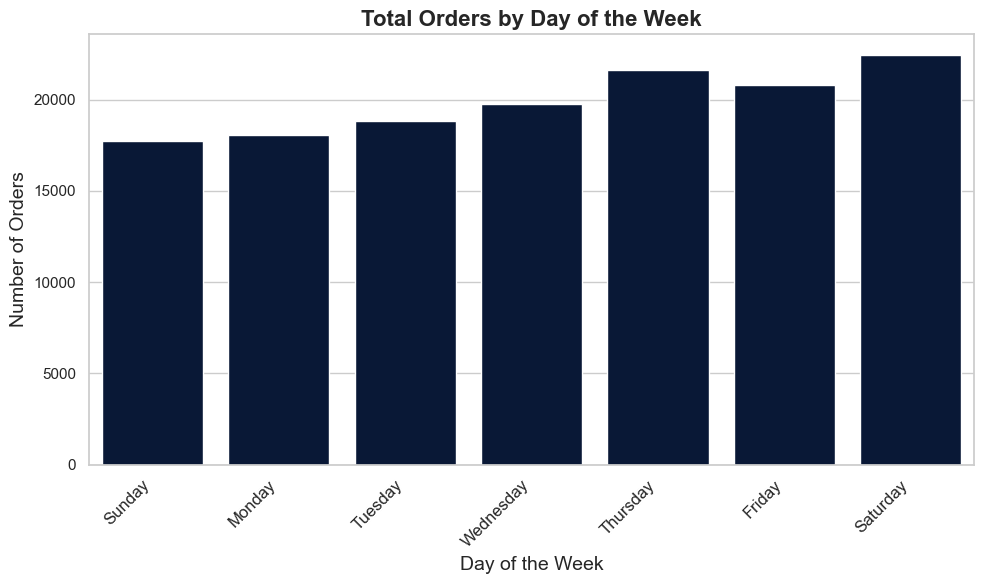

In [284]:
orders_by_day = data[dow_columns].sum()
#orders_by_day = orders_by_day.sort_values(ascending=False)
days_of_week = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
plt.figure(figsize=(10, 6))
sns.barplot(x=days_of_week, y=orders_by_day.values, color='#01153E')
plt.title('Total Orders by Day of the Week', fontsize=16, fontweight='bold')
plt.xlabel('Day of the Week', fontsize=14)
plt.ylabel('Number of Orders', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.tight_layout()
plt.show()

##### 3.1.2.2. INTERPRETATIONS

- **Customer_age**:
The customer's age has a mean value of 27, suggesting that most customers are relatively young. This is confirmed by looking at the aged quantiles: 50% of the customers are 26 years old or younger and 75% of the customers are 31 years old or younger. The piechart indicates that 63.5% of customers are in their twenties The maximum age of 80 years old appears to be an outlier.

- **Vendor_count and product_count**: The vendor_count median value is 2, and 75% of the customers ordered from 4 or less different vendors. The maximum value 41 is clearly an outlier, which may be skewing the mean to approximately 3. This indicates that customers develop loyalty towards a specific vendor or a small group of vendors. The average product count is 5.67, with the median being 3. The high variability of this feature, suggests that while the majority only bought a few products, there is a group of customers that purchased a significantly larger quantity. 

- **Is_chain**: According to the metadata, is_chain appears to be a binary variable, but the statistics tell a different story. The mean is 2.81 and the median is 2, what could indicate that the variable reflects the number of times the customer has ordered from a chain restaurant. Considering this interpretation, 75% of customers ordered from 3 or less chain restaurants, with an outlier that reaches 83 orders from a chain.This means that most customers order little times from chain restaurants, but there is a small group of customers that do it often.

- **First order and last order**: Both first_order and last_order have a maximum value of 90 (consistent with the three-month data collection period). The last_order median and mean exceed those of first_order, meaning that most customers placed multiple orders. With a median first_order of 22, half of the customers placed their first order in the first 22 days of the dataset, what shows strong early engagement. The 75th percentile for first_order being 45, suggests that 25% of customers placed first orders in the last month and and half of data collection. Last order equaling first order implies a single day activity. 

- **CUI**: Most the cuisines, except for American and Asian, have all their quantiles equal to zero, with only the 75th percentile being non-zero for American and Asian cuisines. This suggests a high level of customer segmentation based on cuisine preferences. The high maximum values for each cuisine further support this observation, indicating that some customers consistently order from one cuisine type. By plotting expenditure by cuisine amongst total spending we can see that the cuisines with highest expenditure are Asian and American. The ones with less expenditure are Cafes, Chicken Dishes and desserts, which makes sense since they are usually cheaper items.

- **DOW**: The days of the week have all their quantiles equal to zero, except for the 75% quantile that is consistently equal to one. The maximum values for these features are very close to each other, indicating that even though some customers order more often, they are relatively consistent across the week. This seems to indicate that the features have very similar distributions. 
We have less orders on Sunday and Monday and more orders on Thursday and Saturday, indicating that orders tend to increase as the week goes by, peaking on the weekend. 

- **HR**: All hours have their quantiles equal to zero, which probably means that the customers can be distinguished based on the specific times they place orders. The maximum values of order counts per hour are higher from 9am to 1:00pm and from 3pm to 7pm, which we can identify as eating hours. We can also observe that from 9pm to 7am the number of orders decreases a lot, with a slight peak at 3am.


### 3.2. MISSING VALUES AND OUTLIERS

#### 3.2.1. MISSING VALUES

In [285]:
data_num.isna().sum()

customer_age               727
vendor_count                 0
product_count                0
is_chain                     0
first_order                106
last_order                   0
CUI_American                 0
CUI_Asian                    0
CUI_Beverages                0
CUI_Cafe                     0
CUI_Chicken Dishes           0
CUI_Chinese                  0
CUI_Desserts                 0
CUI_Healthy                  0
CUI_Indian                   0
CUI_Italian                  0
CUI_Japanese                 0
CUI_Noodle Dishes            0
CUI_OTHER                    0
CUI_Street Food_Snacks       0
CUI_Thai                     0
DOW_0                        0
DOW_1                        0
DOW_2                        0
DOW_3                        0
DOW_4                        0
DOW_5                        0
DOW_6                        0
HR_0                      1164
HR_1                         0
HR_2                         0
HR_3                         0
HR_4    

We have the following initial missing values:<br>
**customer_age**: 727<br>
**first_order**: 106<br>
**HR_0**: 1164

After checking the possible values for the categorical features, we noticed that there are no missing values, but some of them have values stored as '-'. This topic will be discussed on the report, we are now going to look at the percentage of the data set that has missing values and values stored as '-'.

In [286]:
prop_missing_values = data['HR_0'].isna().sum() / len(data['HR_0'])
print("The missing values on HR_0 represent",round(prop_missing_values*100,2), "% of all HR_0 values" )

The missing values on HR_0 represent 3.65 % of all HR_0 values


In [287]:
prop_missing_values1 = data['customer_age'].isna().sum() / len(data['customer_age'])
print("The missing values on customer_age represent",round(prop_missing_values1*100,2), "% of all customer_age values" )

The missing values on customer_age represent 2.28 % of all customer_age values


In [288]:
prop_missing_values2 = data['first_order'].isna().sum() / len(data['first_order'])
print("The missing values on first_order represent",round(prop_missing_values2*100,2), "% of all first_order values" )

The missing values on first_order represent 0.33 % of all first_order values


In [289]:
prop_missing_values3 = (data['customer_region'] == '-').sum() / len(data['customer_region'])
print("The missing values on customer_region represent",round(prop_missing_values3*100,2), "% of all customer_region values" )

The missing values on customer_region represent 1.39 % of all customer_region values


In [290]:
prop_missing_values4 = (data['last_promo'] == '-').sum() / len(data['last_promo'])
print("The missing values on last_promo represent",round(prop_missing_values4*100,2), "% of all last_promo values" )

The missing values on last_promo represent 52.53 % of all last_promo values


##### 3.2.1.1. MISSING VALUES ON HR_0

In [291]:
data[(data['HR_0'].isna()) & ((data.loc[:, 'HR_1':'HR_23'].sum(axis=1)==data.loc[:, 'DOW_0':'DOW_6'].sum(axis=1))==False)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,
ae38da6386,8670,21.0,2,3,1,0.0,7,DELIVERY,DIGI,0.00,...,0,0,0,0,0,0,0,0,0,0
a21a839c77,4140,19.0,1,4,4,0.0,21,-,CARD,0.00,...,0,0,0,0,0,1,0,0,1,0
9237d23413,8670,22.0,3,4,2,0.0,27,-,CARD,5.77,...,0,0,0,0,0,0,0,0,0,0
8c6ffd7357,4660,25.0,3,4,1,0.0,28,-,CARD,27.54,...,0,1,0,0,0,0,0,0,0,0
67c6c9f9c4,4660,24.0,1,3,0,0.0,36,FREEBIE,DIGI,0.00,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37b72b449d,2360,23.0,1,4,0,85.0,85,DELIVERY,DIGI,0.00,...,0,0,0,0,0,0,0,0,0,0
ac382ddfd1,-,28.0,1,2,2,87.0,89,DELIVERY,CARD,0.00,...,0,0,0,0,0,0,0,0,0,1
96f1fc25e3,8670,25.0,2,2,1,88.0,88,DELIVERY,CASH,0.00,...,0,0,0,0,0,0,0,0,0,0


In [292]:
orders_in_hours = data.loc[:, 'HR_1':'HR_23'].sum(axis=1)
data.loc[:, 'HR_1':'HR_23'].sum(axis=1)

pd.Series(data.loc[:, 'HR_1':'HR_23'].sum(axis=1)==data.loc[:, 'DOW_0':'DOW_6'].sum(axis=1)).value_counts()

#data['HR_0'].replace(np.nan, orders_in_hours, inplace=True)

True     30711
False     1164
Name: count, dtype: int64

The rows with missing values in HR_0 don't have the sum across HR equal to the sum of DOW. <br>
HR_0 is the only hour that has missing values, and all non-missing values are zero. This probably means that the system crashes at that hour. To address this, one solution is to compare the sum of orders across DOW (days of the week) with the sum of orders across HR (hours) to impute the missing values and correct the zeros in HR_0 that may be mistaken. 

##### 3.2.1.2. MISSING VALUES ON first_order

In [293]:
data[data['last_order']==0]['first_order'].isna().sum()

106

In [294]:
data[data['last_order']==0].shape

(106, 55)

The rows with missing values in first_order are the same rows that have last_order equal to zero. <br>
If last_order is zero, that means that the last order for that customer was placed in the day the dataset was created, and no other order was placed. We believe that in this case, the value for first_order was not updated, and in that case, the zero imputation is coherent. In fact, last_order equal to zero and first_order being a missing value happens in the exact same rows.

#### 3.2.2. OUTLIERS

We will calculate the percentage of **outliers** in each variable, having the threshold equal to the one used in the boxplot.

In [295]:
for column in numeric_features:
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR


    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]

    outlier_percentage = (len(outliers) / len(data)) * 100
    print(f"Percentage of outliers in {column}: {outlier_percentage:.2f}%")

Percentage of outliers in customer_age: 3.40%
Percentage of outliers in vendor_count: 4.78%
Percentage of outliers in product_count: 7.44%
Percentage of outliers in is_chain: 9.89%
Percentage of outliers in first_order: 0.00%
Percentage of outliers in last_order: 0.00%
Percentage of outliers in CUI_American: 11.00%
Percentage of outliers in CUI_Asian: 10.89%
Percentage of outliers in CUI_Beverages: 17.04%
Percentage of outliers in CUI_Cafe: 4.29%
Percentage of outliers in CUI_Chicken Dishes: 10.19%
Percentage of outliers in CUI_Chinese: 11.05%
Percentage of outliers in CUI_Desserts: 6.32%
Percentage of outliers in CUI_Healthy: 6.80%
Percentage of outliers in CUI_Indian: 10.82%
Percentage of outliers in CUI_Italian: 20.23%
Percentage of outliers in CUI_Japanese: 19.76%
Percentage of outliers in CUI_Noodle Dishes: 6.98%
Percentage of outliers in CUI_OTHER: 22.09%
Percentage of outliers in CUI_Street Food_Snacks: 13.31%
Percentage of outliers in CUI_Thai: 7.46%
Percentage of outliers in D

#### 3.2.3. CONCLUSIONS

- **Customer_region**: Each broader region contains three sub-regions, except for the region starting with 4, that only contains two. Based on this, we might hypothesize that the missing values belong to the broader region starting with 4. We can also assign '-' region into an unknown region. We will check for the multivaritate analysis and visualizations in order to better understand how to treat this '-' region.

- **Last_promo**: There are 4 types of promotion, one of them labeled as ‘-’. In fact, this is the most frequent value, for more than half of the observations (52,5%). This might indicate that the customer never used a promotion. Another possibility is that a popular promotion wasn’t properly labeled, though this seems less likely.

- **Payment_Method**: There are no missing values.

- **Customer_age**: There are missing values (2,28% of observations) in the age column. We may need to use the median to treat them, once the age of the customers is within a small range of values, and the median seems to be a good representation of the customers’ overall age. 
In fact, according to the boxplot, people with more than 40 years old are outliers. They represent around 3% of the dataset, but looking at the pairplots, older customers do not seem to be severe multivariate outliers. We can remove them and proceed only with the younger customers or keep them and try to develop a marketing strategy attractive to older customers or define a threshold to reduce the impact of the outliers.  

- **Is_chain**: The outliers start to become sparser after the value 45, so this might be a good thereshold

- **Vendor_count and product_count**: The outliers for vendor_count seem to be relevant given a threshold of about 35 vendors, when they start to become sparser There is a clear outlier for product_count. After the value 100, the outliers start to become sparser.

- **First order and last order**: All the observations with missing values in first_order have last_order equal to zero. It is a significant number of missing values, so we are thinking about replacing them with zero. If last_order is zero, that means that the last order for that customer was placed in the day the dataset was created, and no other order was placed. We believe that in this case, the value for first_order was not updated, and the zero imputation is coherent. In fact, last_order equal to zero and first_order being a missing value happens in the exact same rows.
In the boxplot, there are no outliers for these two variables. Moreover, the boxplots are symmetric, meaning that there are a significant number of customers that used the app more than once

- **CUI**: None of the CUI features has missing values. According to the boxplots, there are a lot of outliers for all the cuisine features. Nevertheless, this also seems to indicate that we have good customer discrimination based on the type of cuisine. All the cuisines have a lot of zeros and a lot of extreme values, meaning that there are customers who never buy from that type of cuisine and others that do it often. As a consequence, we will not remove the outliers.

- **DOW**: All days of the week have outliers, but we likely have a situation where the customers are well distinguished by the hours of the day they place an order, so the extreme values may be relevant to do the segmentation required. We believe it is a good solution to move the threshold of the outliers to when they start to become sparser in the boxplot.

- **HR**: What happens with the outliers for cuisine happens here too. We have a lot of extreme values and a lot of zeros for each hour of the day, meaning there is good customer segmentation based on the order placing hours. These outliers may as well occur because we have small slots of time (hours) to describe the parts of the day. If we group them based on the time of the day they are referring to, we may significantly reduce the number of outliers.

### 3.3. ANOMALIES

#### 3.3.1. product_count and vendor_count

In [296]:
(data[(data['vendor_count']==0) & (data['product_count']==0)]).loc[:, 'DOW_0':'DOW_6'].sum(axis=1).value_counts()

0    138
Name: count, dtype: int64

In [297]:
data[data.loc[:, 'DOW_0':'DOW_6'].sum(axis=1)==0]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
1b7c34738e,8670,24.0,0,0,0,3.0,3,-,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177ede2420,8670,30.0,0,0,1,86.0,86,-,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0
0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0


When product_count and vendor_count are zero, the sum across DOW is always zero. This happens in 138 rows. There are no other rows where the sum across DOW is zero. In this rows there are values for last_order and first_order, so probably these are customers that tried to place an order in the app but never finished it. They represent a very small percentage os the data set so we will likely drop them.

In [298]:
data[(data['product_count']==0) & (data['vendor_count']!=0)].loc[:, 'DOW_0':'DOW_6'].sum(axis=1).value_counts()

1    18
Name: count, dtype: int64

In [299]:
data[(data['product_count']==0) & (data['vendor_count']!=0)]['vendor_count'].value_counts()

vendor_count
1    18
Name: count, dtype: int64

In [300]:
data[(data['product_count']!=0) & (data['vendor_count']==0)].shape

(0, 55)

There are 18 rows where product_count is zero and vendor_count is not zero and the sum across DOW are not zero. Those rows are not coherent and represent a very small percentage of the data set and it will propably be droped.

#### 3.3.2. is_chain

In [301]:
data[data['is_chain']>data.loc[:, 'DOW_0':'DOW_6'].sum(axis=1)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
376f896388,8670,29.0,0,0,1,7.0,7,DELIVERY,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0
8a7b681c19,8670,17.0,0,0,1,7.0,7,-,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
a2b54d0827,8670,24.0,0,0,1,7.0,7,DELIVERY,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
00b63adfed,8670,27.0,0,0,1,84.0,84,DELIVERY,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
c3d607c31f,8670,35.0,0,0,1,85.0,85,DISCOUNT,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
177ede2420,8670,30.0,0,0,1,86.0,86,-,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0


When we compare the total orders to is_chain values we observe that there are 75 rows where is_chain takes bigger values than the total number of orders, which is impossible with the interpretation of the variable stated above. If we drop the incoherences in product count we drop as well the incoherences in is_chain.

#### 3.3.3. CUI

In [302]:
data[data['CUI_Asian']>=data[['CUI_Japanese', 'CUI_Chinese','CUI_Thai']].sum(axis=1)].shape

(23572, 55)

For geographic coherence, the sum of CUI Thai, Chinese and Japanese should be at least less or equal to CUI Asian, but that is not the case.

### 3.4 MULTIVARIATE ANALYSIS

#### 3.4.1 RELATIONSHIPS BETWEEN CATEGORICAL AND NUMERICAL FEATURES

**Distribution of age** by last promo, payment method and customer region.

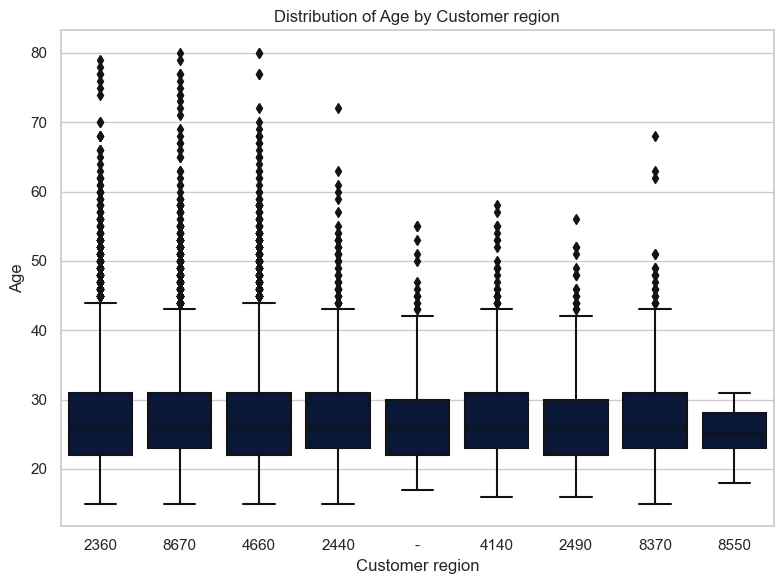

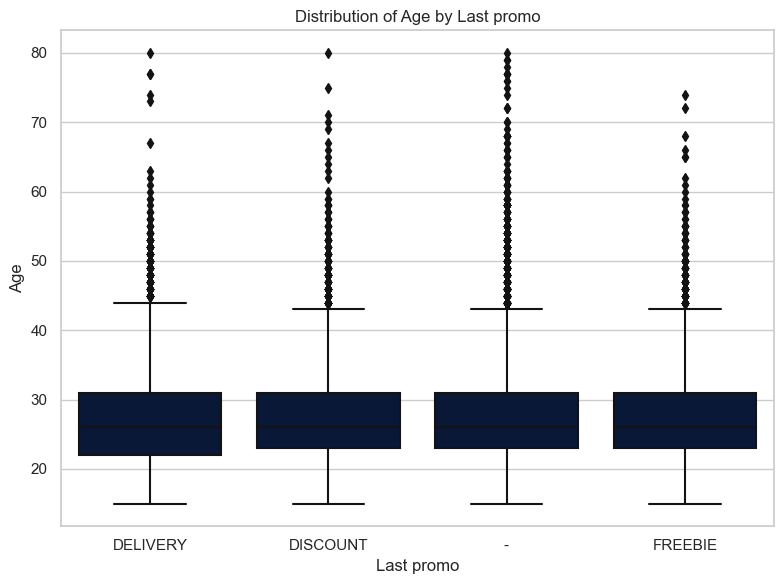

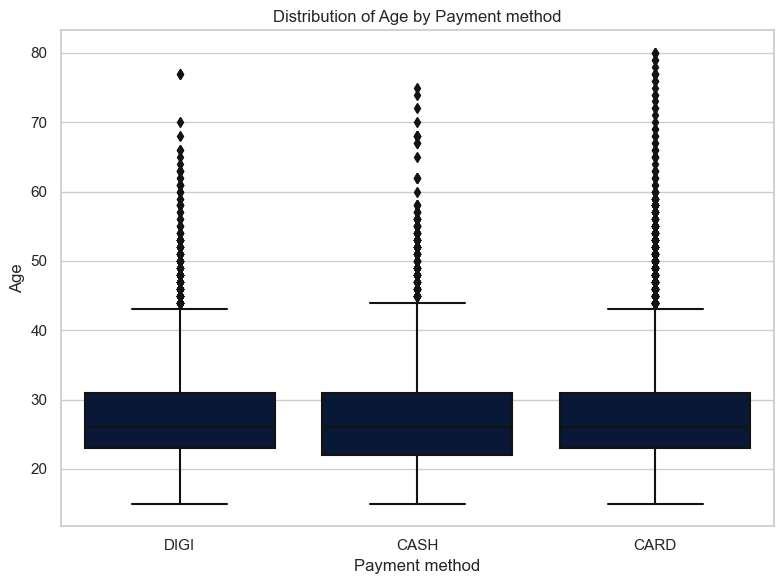

In [303]:
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y='customer_age', x=feature, data=data, color='#01153E')
    plt.title(f'Distribution of Age by {feature.replace("_", " ").capitalize()}')
    plt.xlabel(feature.replace("_", " ").capitalize())
    plt.ylabel('Age')
    plt.tight_layout()
    plt.show()

These visualizations show that there is no significant difference in the distribution of age when it comes to the different payment methods, the different promos and the different regions. 

**Distribution of fisrt_order** by customer_region, last_promo and payment_method

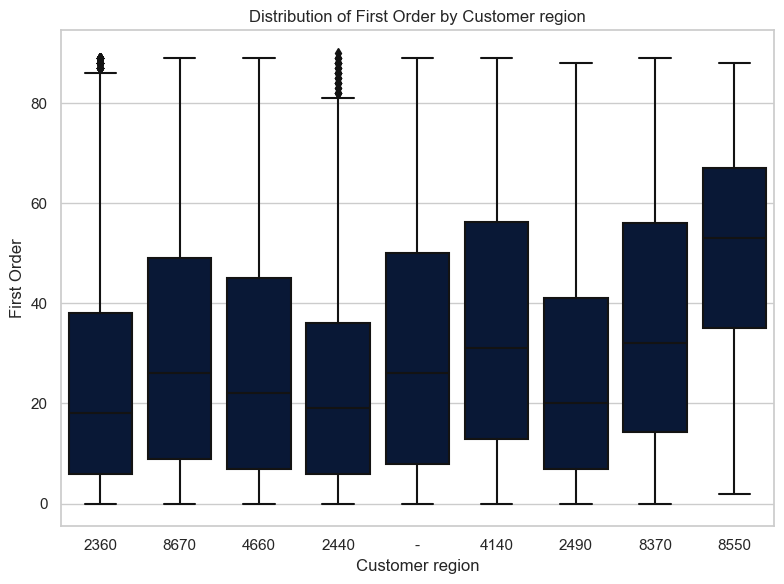

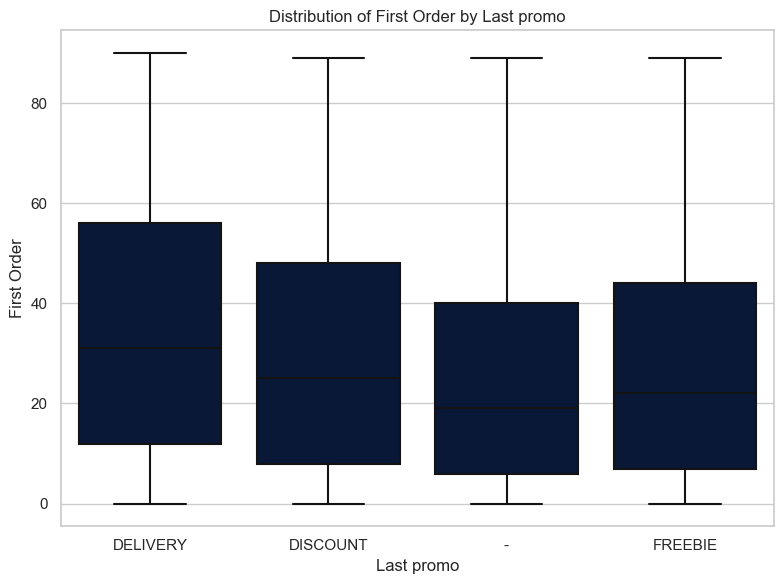

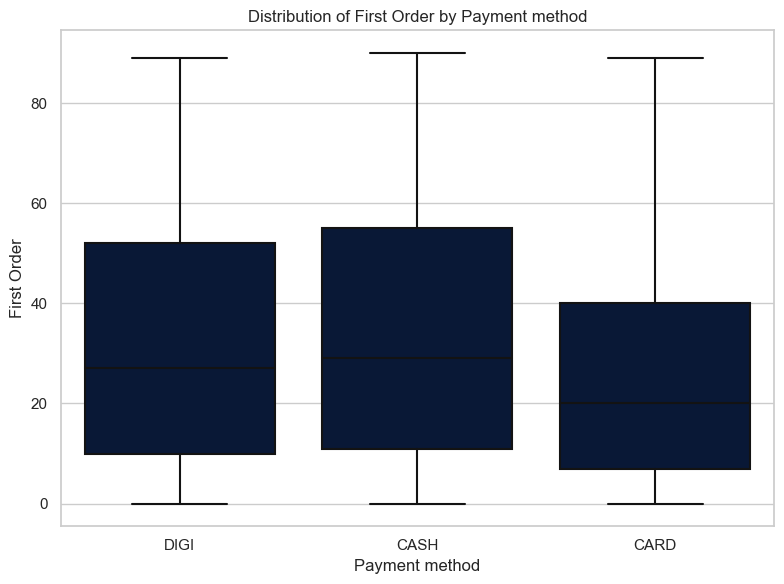

In [304]:
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y='first_order', x=feature, data=data, color='#01153E')
    plt.title(f'Distribution of First Order by {feature.replace("_", " ").capitalize()}')
    plt.xlabel(feature.replace("_", " ").capitalize())
    plt.ylabel('First Order')
    plt.tight_layout()
    plt.show()

When comparing first_order with the customer_region, we understand that in region 8550 the customers placed their first order mostly in the second half of the data collection (this region only have 13 customers). <br>
When it comes to payment method and last promo, there is not a significant difference in the distribution of first order in the different categories.

**Distribution of last_order** by customer_region, last_promo and payment_method

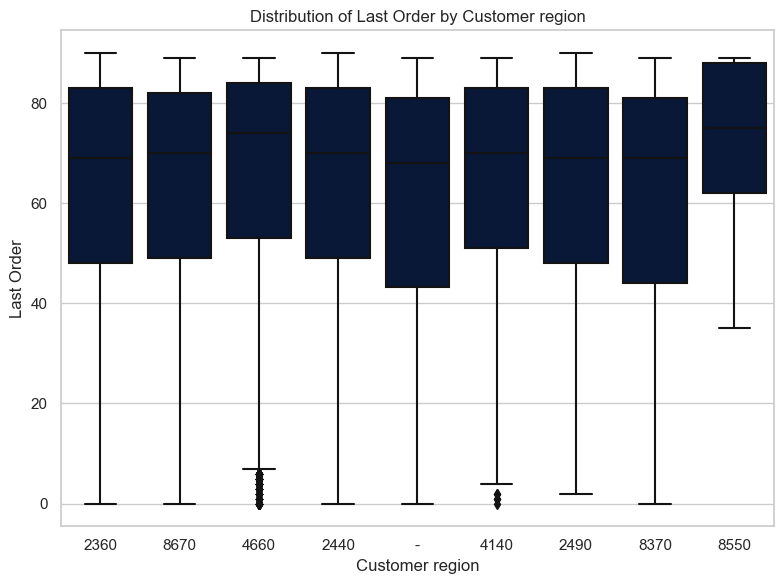

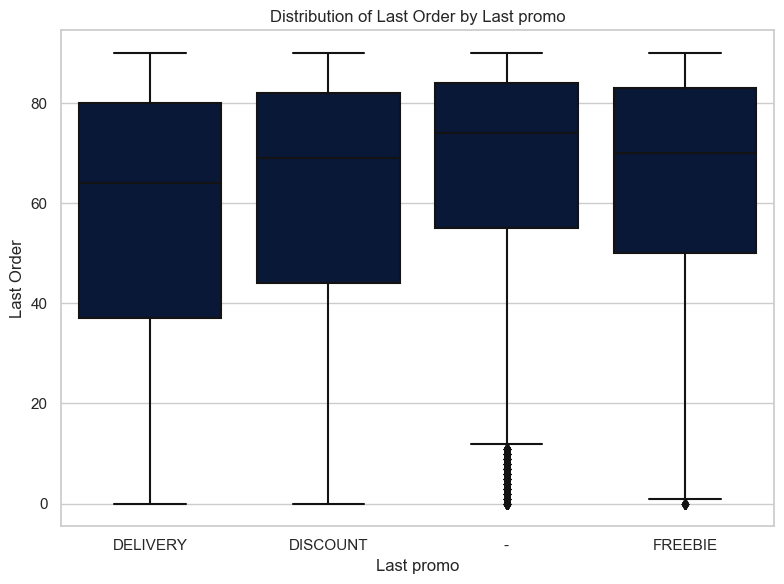

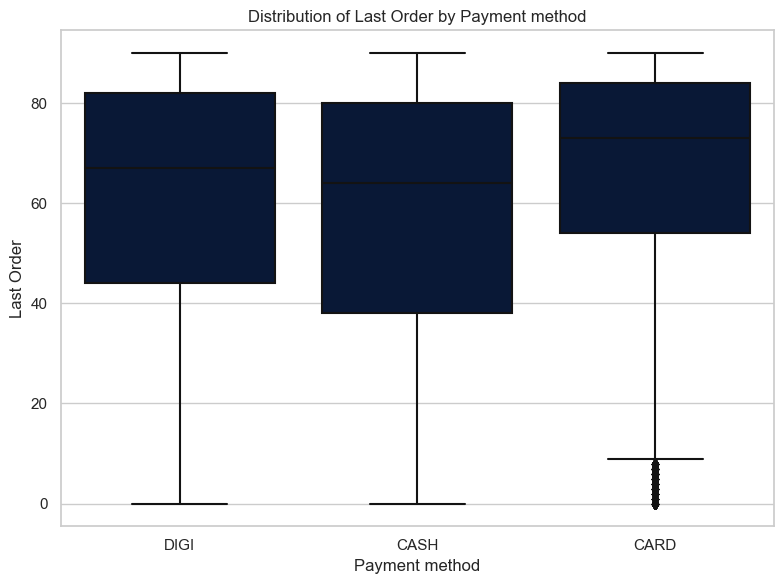

In [305]:
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y='last_order', x=feature, data=data, color='#01153E')
    plt.title(f'Distribution of Last Order by {feature.replace("_", " ").capitalize()}')
    plt.xlabel(feature.replace("_", " ").capitalize())
    plt.ylabel('Last Order')
    plt.tight_layout()
    plt.show()

As expected after analysing the visualizations with first order, in region 8550, the customers placed their last order in the last days of the data collection. (this region only has 13 customers) <br>
When it comes to payment method and last promo, there is not a significant difference in the distribution of last order in the different categories.

**Distribution of vendor_count** by customer_region, last_promo and payment_method

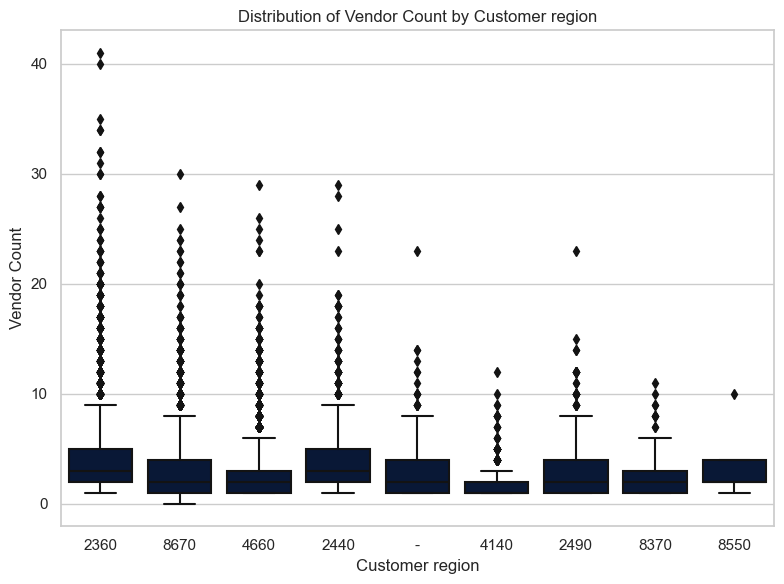

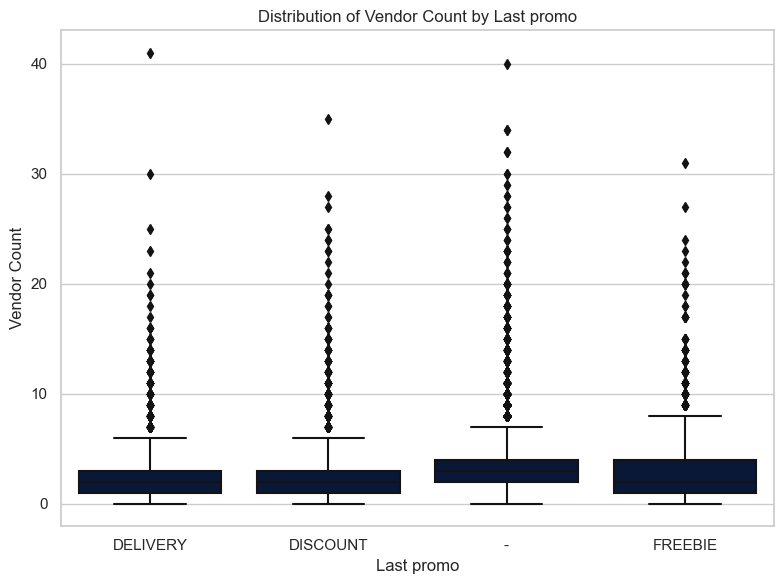

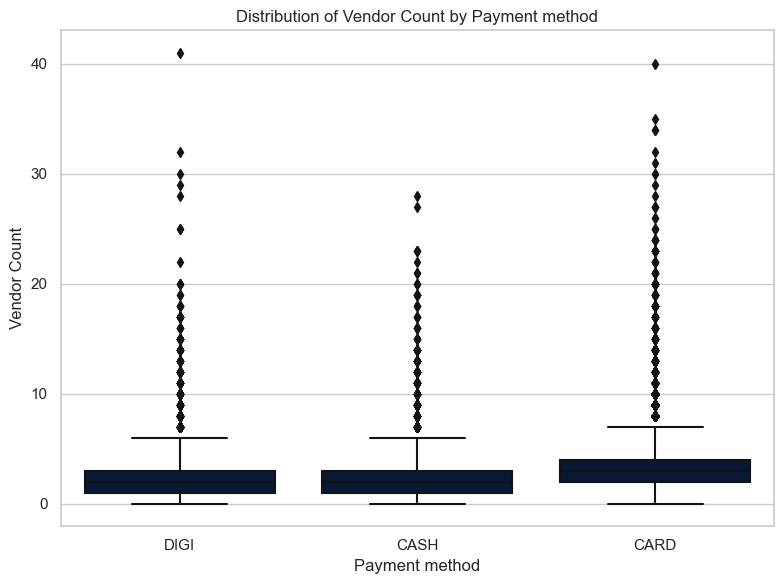

In [306]:
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y='vendor_count', x=feature, data=data, color='#01153E')
    plt.title(f'Distribution of Vendor Count by {feature.replace("_", " ").capitalize()}')
    plt.xlabel(feature.replace("_", " ").capitalize())
    plt.ylabel('Vendor Count')
    plt.tight_layout()
    plt.show()

Vendor_count has a very similar distribution when it comes to different customer regions, different last promo and different payment methods.

**Distribution of product_count** by customer_region, last_promo and payment_method

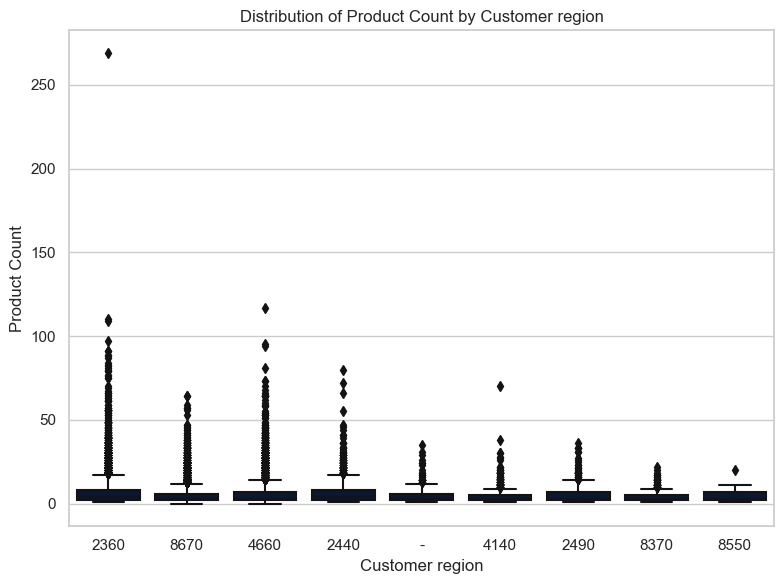

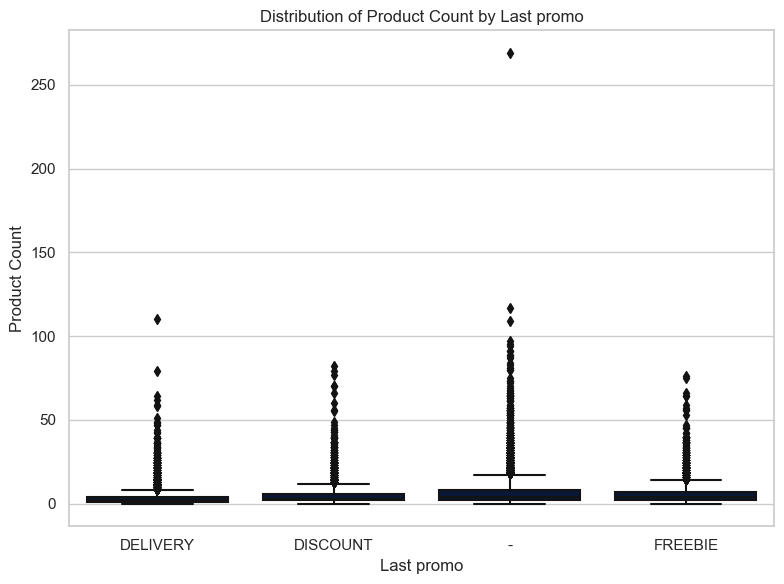

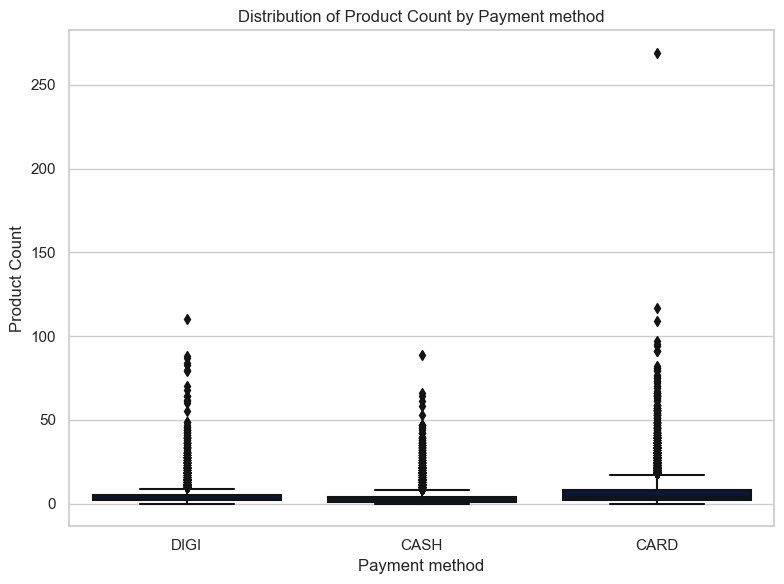

In [307]:
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y='product_count', x=feature, data=data, color='#01153E')
    plt.title(f'Distribution of Product Count by {feature.replace("_", " ").capitalize()}')
    plt.xlabel(feature.replace("_", " ").capitalize())
    plt.ylabel('Product Count')
    plt.tight_layout()
    plt.show()

With product_count happens the same as vendor_count.

We will not plot for is_chain because we will probably get the same conclusions, because, as we will check in the multivariate analysis, is_chain is significantly correlated with vendor_count and product_count.

**Proportion of money spent on each cuisine** by customer_region, last_promo and payment_method

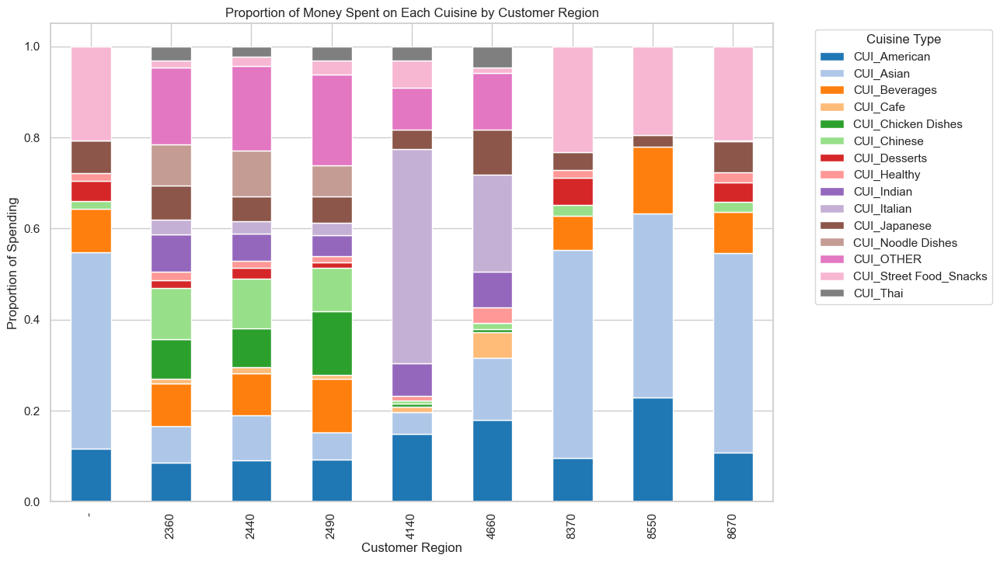

In [308]:
region_cuisine_data = data.groupby('customer_region')[cuisine_columns].sum()

region_cuisine_proportion = region_cuisine_data.div(region_cuisine_data.sum(axis=1), axis=0)

colors = plt.get_cmap("tab20").colors  
region_cuisine_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), color=colors)
plt.title('Proportion of Money Spent on Each Cuisine by Customer Region')
plt.xlabel('Customer Region')
plt.ylabel('Proportion of Spending')
plt.legend(title='Cuisine Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

This visualization helps to understand that customers from different regions have preference for different types of cuisines. As a consequence, regions are important to distinguish the preference of customers when it comes to what they spent on.<br>
In fact, the region '-' has a similar bar distribution to the other bars that represent the broader region 8. This will be usefull to decide how we will treat the region stored as '-'.

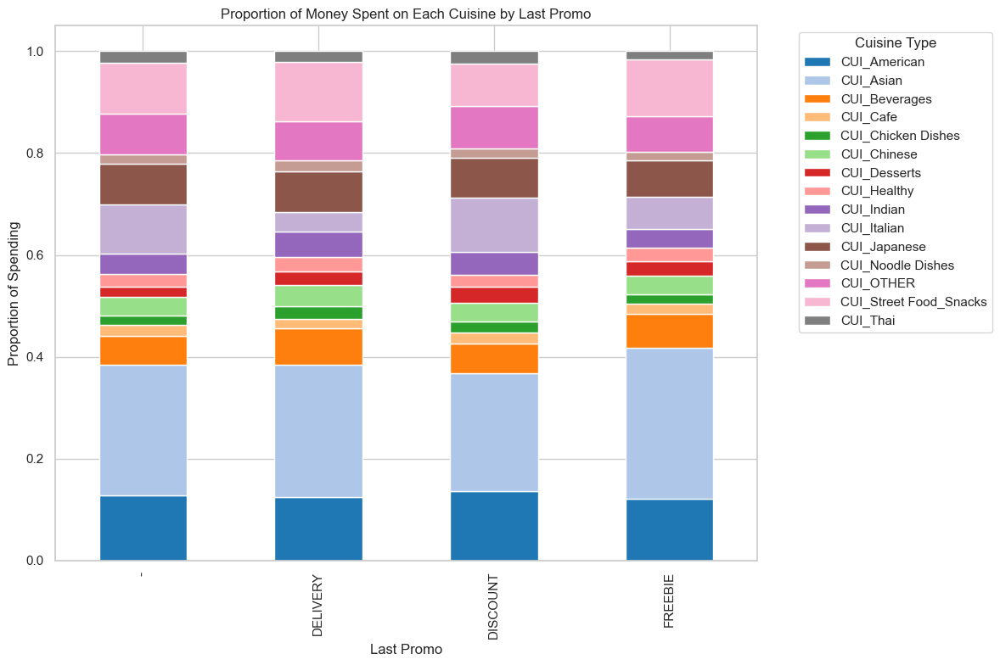

In [309]:
promo_cuisine_data = data.groupby('last_promo')[cuisine_columns].sum()

promo_cuisine_proportion = promo_cuisine_data.div(promo_cuisine_data.sum(axis=1), axis=0)

promo_cuisine_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), color=colors)
plt.title('Proportion of Money Spent on Each Cuisine by Last Promo')
plt.xlabel('Last Promo')
plt.ylabel('Proportion of Spending')
plt.legend(title='Cuisine Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

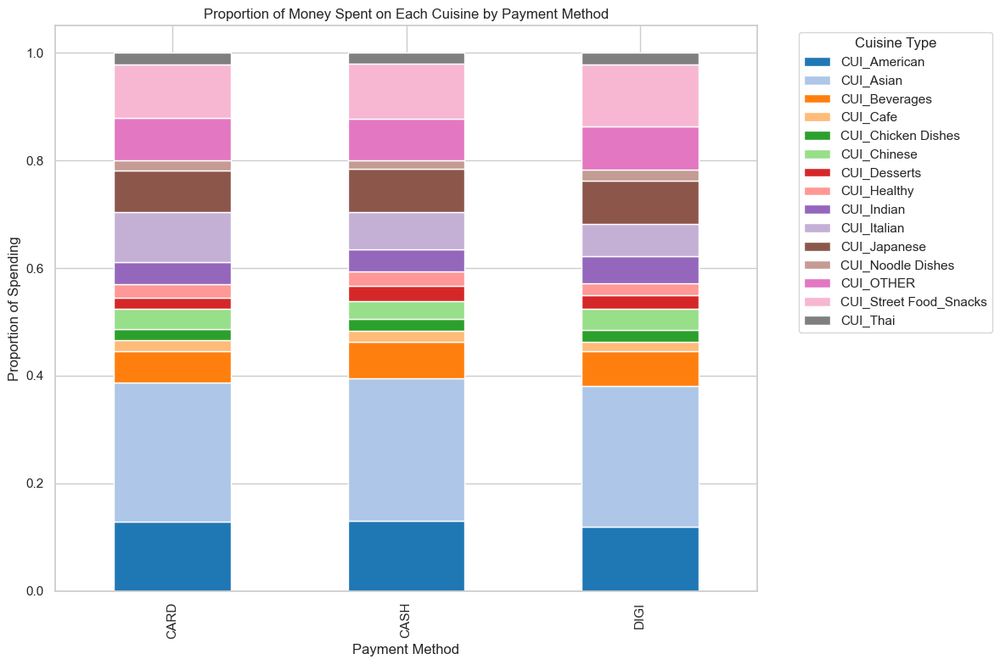

In [310]:
payment_cuisine_data = data.groupby('payment_method')[cuisine_columns].sum()

payment_cuisine_proportion = payment_cuisine_data.div(payment_cuisine_data.sum(axis=1), axis=0)

colors = plt.get_cmap("tab20").colors  
payment_cuisine_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), color=colors)
plt.title('Proportion of Money Spent on Each Cuisine by Payment Method')
plt.xlabel('Payment Method')
plt.ylabel('Proportion of Spending')
plt.legend(title='Cuisine Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Different payment methods and different last promo have the same distribution of cuisine preference. This means that they are not helpful in distinguish customers based on their cuisine preference.

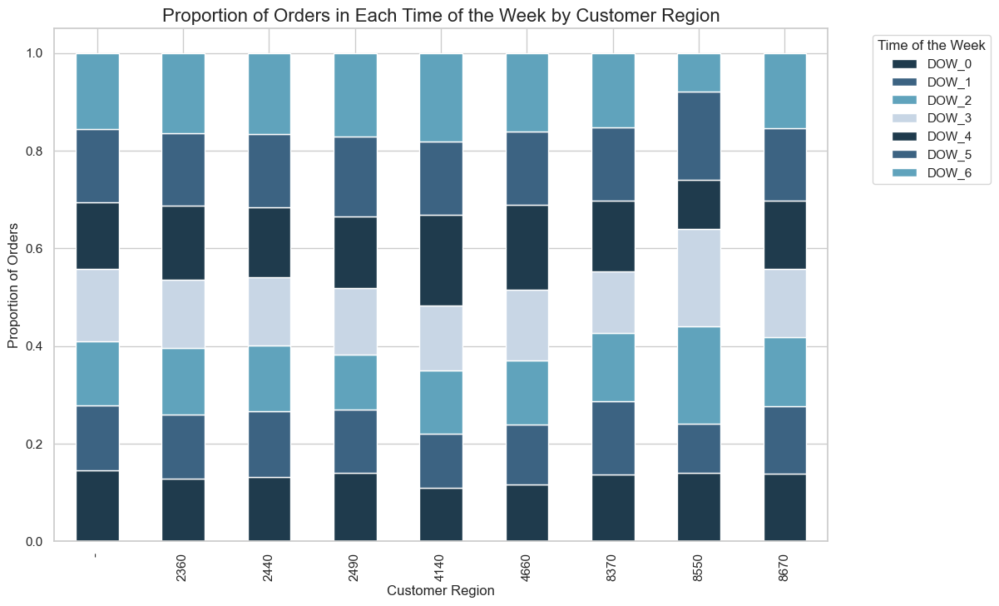

In [311]:
colors = ['#1f3b4d', '#3c6382', '#60a3bc', '#c8d6e5']

region_week_data = data.groupby('customer_region')[dow_columns].sum()

region_week_proportion = region_week_data.div(region_week_data.sum(axis=1), axis=0)

region_week_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), color=colors)
plt.title('Proportion of Orders in Each Time of the Week by Customer Region', fontsize=16)
plt.xlabel('Customer Region')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of the Week', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

This visualization shows that all customers in the different regions have the same order patterns across the week.

#### 3.4.2 RELATIONSHIPS BETWEEN CATEGORICAL FEATURES

**Percentage distribution of last_promo and payment_method** within customer_region.

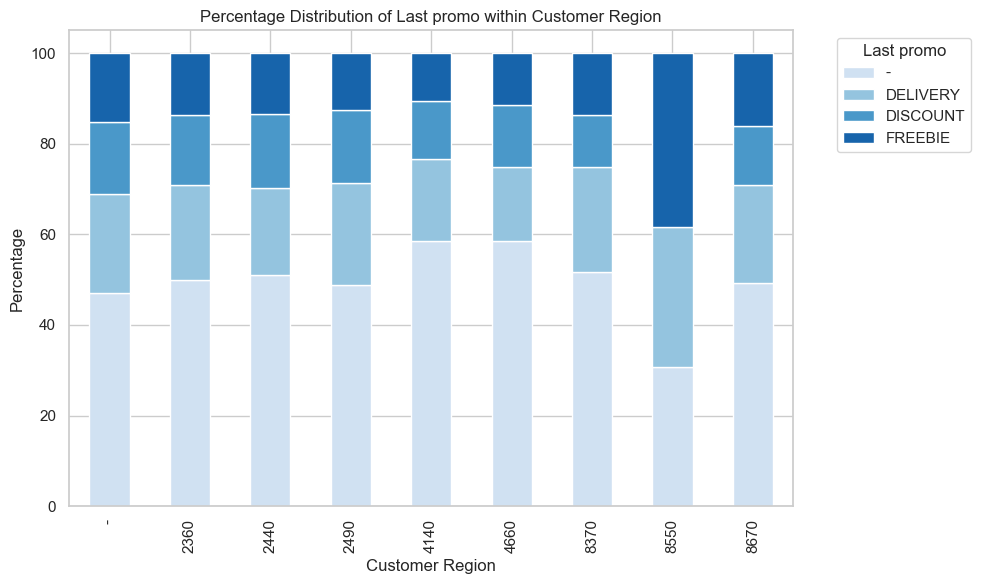

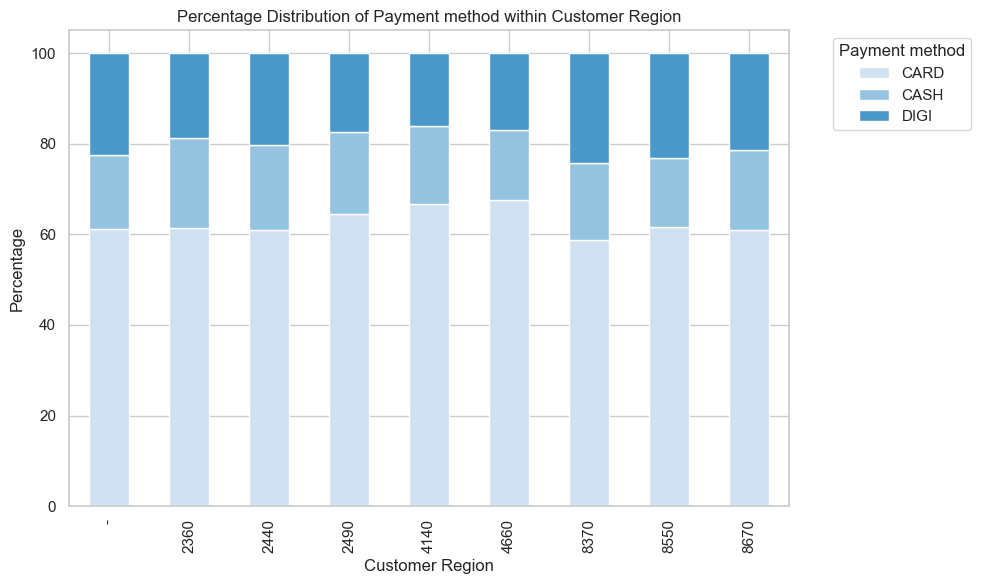

In [312]:
other_features = ['last_promo', 'payment_method']

palette = sns.color_palette("Blues", n_colors=4)

for feature in other_features:
    cross_tab = pd.crosstab(data['customer_region'], data[feature], normalize='index') * 100
    cross_tab.plot(kind='bar', stacked=True, figsize=(10, 6), color=palette)
    
    plt.title(f'Percentage Distribution of {feature.replace("_", " ").capitalize()} within Customer Region')
    plt.xlabel('Customer Region')
    plt.ylabel('Percentage')
    plt.legend(title=feature.replace("_", " ").capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

All different regions have the same distribution when it comes to last promo and payment method, except for region 8550, that does not have customers using DISCOUNT promo, and has the majority of the customers using FREEBIE. Nevertheless, it is important to mention that only 13 customers from this region used the app in the 90 days of data collection.

**Percentage distribution of payment_method** within last_promo.

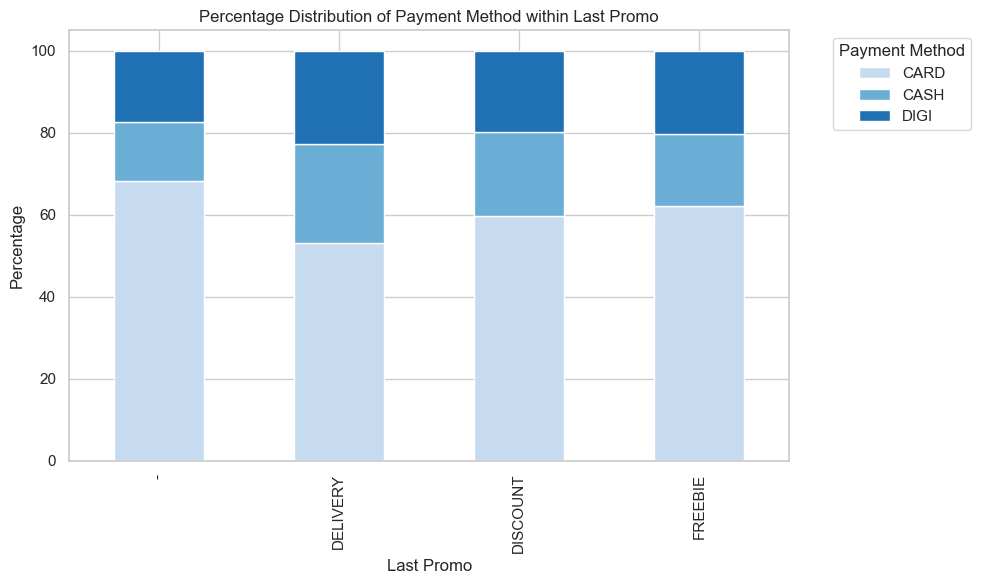

In [313]:
cross_tab = pd.crosstab(data['last_promo'], data['payment_method'], normalize='index') * 100
palette = sns.color_palette("Blues", n_colors=cross_tab.shape[1])

cross_tab.plot(kind='bar', stacked=True, figsize=(10, 6), color=palette)
plt.title('Percentage Distribution of Payment Method within Last Promo')
plt.xlabel('Last Promo')
plt.ylabel('Percentage')
plt.legend(title='Payment Method', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Customers that never used a promotion paid mostly with card. Appart from that, the distribution of payment methods across promotions are very similar.

#### 3.4.3 RELATIONSHIPS BETWEEN NUMERICAL FEATURES

**Pairplots and hexibins**

c:\Users\Carolina\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


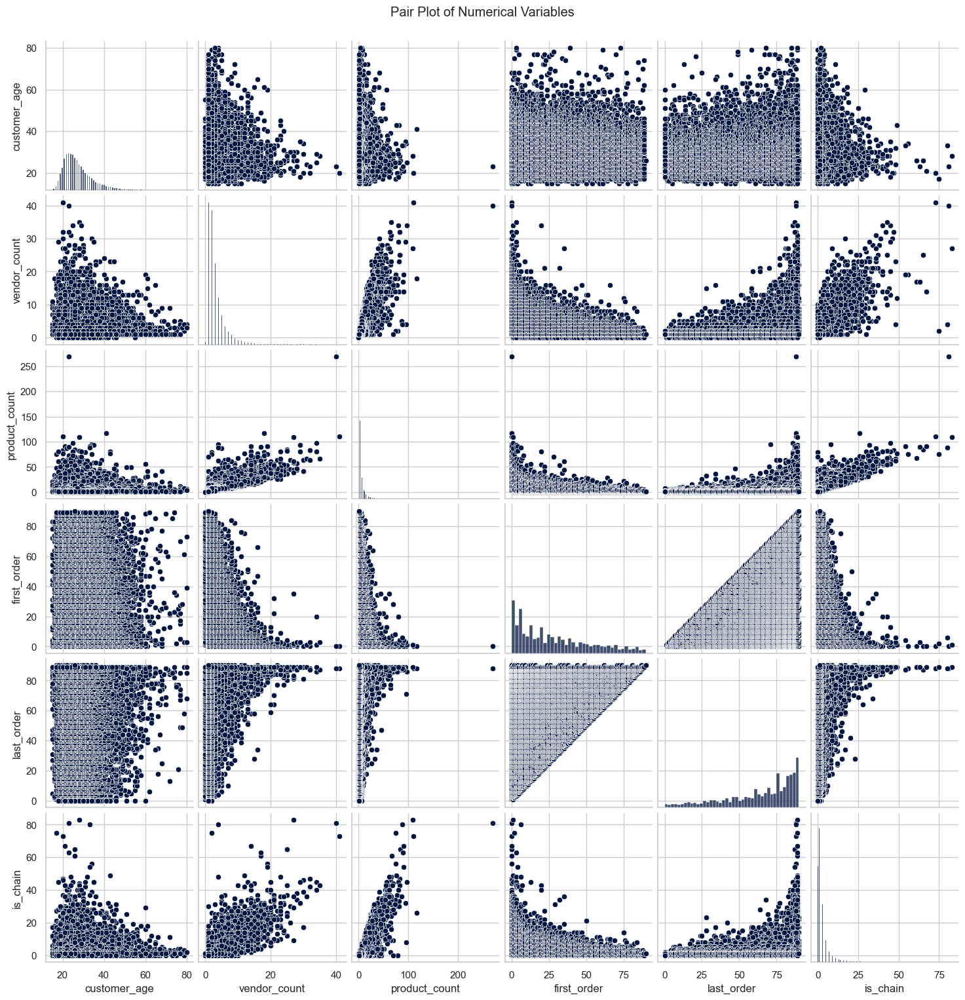

In [314]:
sns.pairplot(
    data, 
    vars=['customer_age', 'vendor_count', 'product_count', 'first_order', 'last_order', 'is_chain'], 
    plot_kws={'color': '#01153E'},   
    diag_kws={'color': '#01153E'}    
)
plt.suptitle('Pair Plot of Numerical Variables', y=1.02)
plt.show()

From these pairplots, we can see that vendor_count, product_count and is_chain have a high linear correlation, implying that customers that order from multiple vendors consequently order more products and customers that order more frequently from chain restaurants also buy more products and vary vendors more. In fact, an increased number of unique vendors doesn't increase proportionally the count of products bought. So, a client who buys from a lot of vendors, is not buying a lot from each, but is rather a diversified customer. We wil later create a variable of products per vendor.

Furthermore, when last order is high, i.e., when the last order the customer placed was done in the last days of the data set, the product count and the vendor count have higher values as well. This might indicate that the customer is a frequent customer and orders from a wider range of vendors. 
There’s a clear negative relationship between customer_age and vendor_count, suggesting that younger customers tend to order from a higher variety of vendors.

These pairplots also show that there are some multivariate outliers that are important to take into consideration when doing the outlier treatment. This will be further explored in the report.

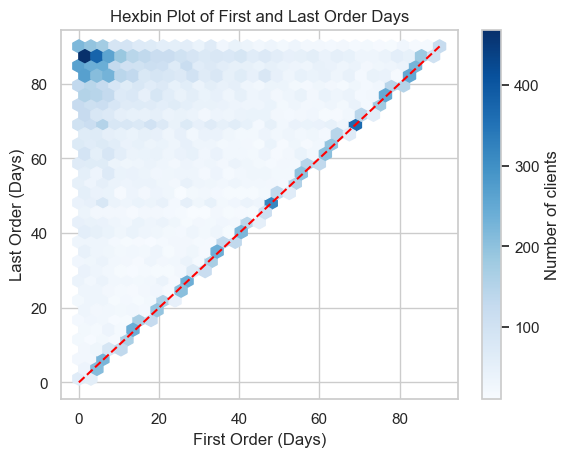

In [315]:

plt.hexbin(data['first_order'], data['last_order'], gridsize=30, cmap='Blues', mincnt=1)

plt.colorbar(label='Number of clients')

plt.plot([data['first_order'].min(), data['first_order'].max()],
         [data['first_order'].min(), data['first_order'].max()], color='red', linestyle='--', label='first_order = last_order')

plt.title('Hexbin Plot of First and Last Order Days')
plt.xlabel('First Order (Days)')
plt.ylabel('Last Order (Days)')

plt.show()

We can distinguish two type of customers: the customers represent in the superior left corner of the graph are the ones that place a first order in the start of data collection and the last in last few days of data collection, this means they are active for a long period of time. On the other hand, we have customer in the diagonal that are one time users.

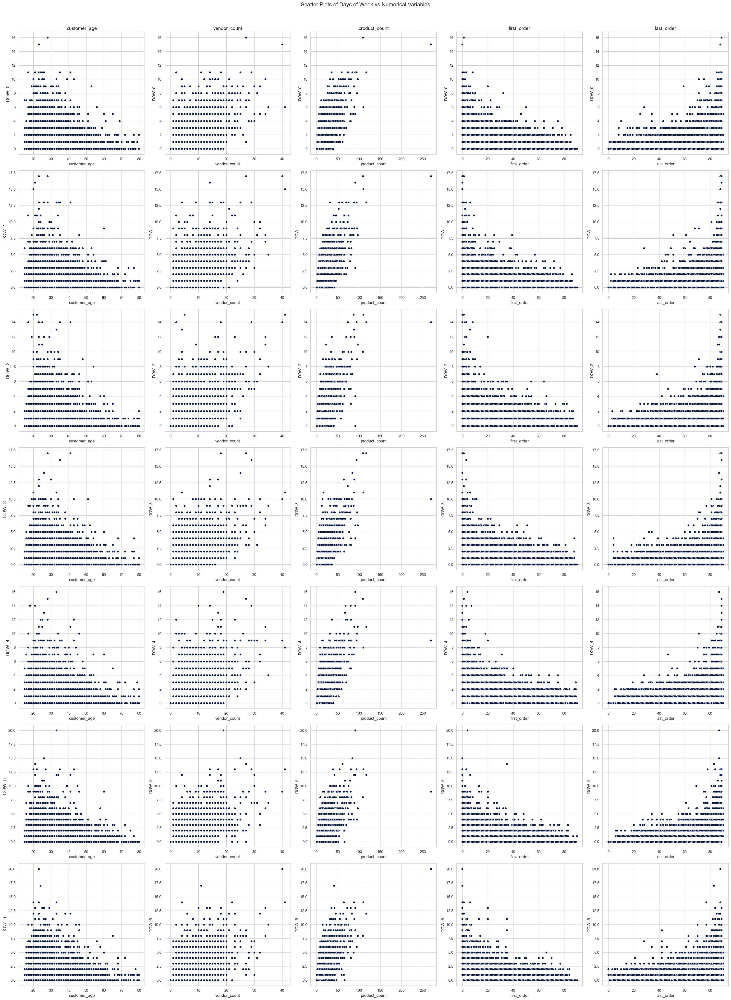

In [316]:
days_of_week_columns = ['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6']
non_days_numerics = ['customer_age', 'vendor_count', 'product_count', 'first_order', 'last_order']

fig, axes = plt.subplots(len(days_of_week_columns), len(non_days_numerics), figsize=(30, 40), sharex=False, sharey=False)

for i, cuisine in enumerate(days_of_week_columns):
    for j, numeric in enumerate(non_days_numerics):
        sns.scatterplot(data=data, x=numeric, y=cuisine, ax=axes[i, j], color='#01153E')

for ax, numeric in zip(axes[0], non_days_numerics):
    ax.set_title(numeric, fontsize=14)

for ax, cuisine in zip(axes[:, 0], days_of_week_columns):
    ax.set_ylabel(cuisine, fontsize=14)

plt.tight_layout()
plt.suptitle('Scatter Plots of Days of Week vs Numerical Variables', fontsize=16, y=1.02)
plt.show()


This visualization shows that there are no extreme multivariate outliers in DOW, other than the ones already mentioned above. Besides, the distribution of the other numerical features remains the same across the week.

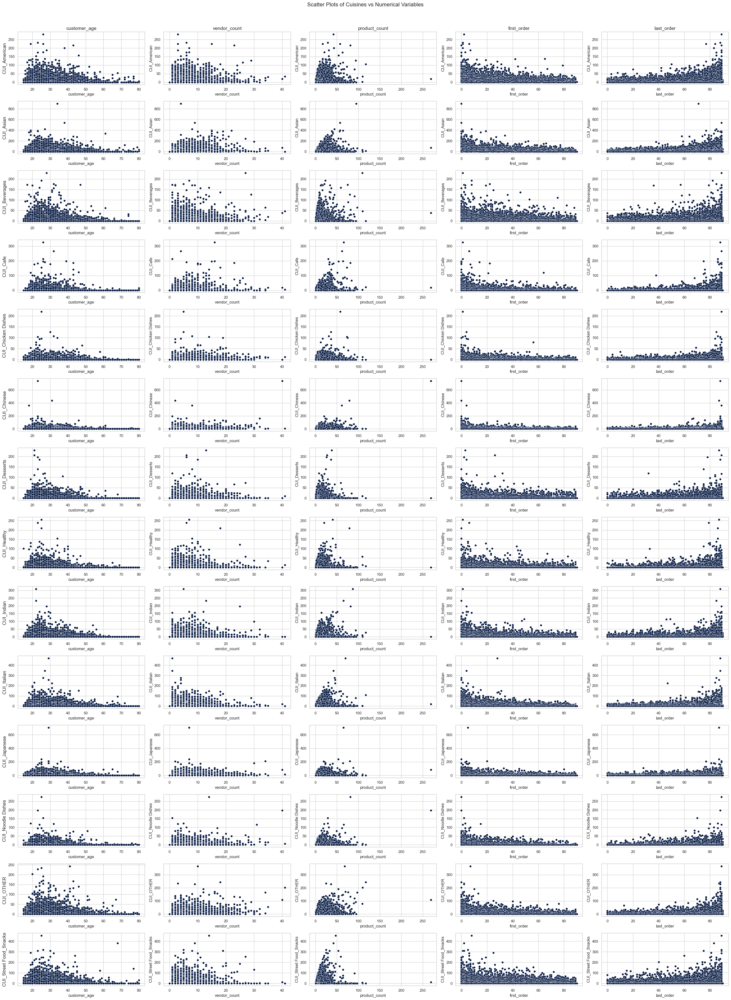

In [317]:
cuisine_columns = ['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food_Snacks']  # Update with your actual column names
non_cuisine_numerics = ['customer_age', 'vendor_count', 'product_count', 'first_order', 'last_order']

fig, axes = plt.subplots(len(cuisine_columns), len(non_cuisine_numerics), figsize=(30, 40), sharex=False, sharey=False)

for i, cuisine in enumerate(cuisine_columns):
    for j, numeric in enumerate(non_cuisine_numerics):
        sns.scatterplot(data=data, x=numeric, y=cuisine, ax=axes[i, j], color='#01153E')


for ax, numeric in zip(axes[0], non_cuisine_numerics):
    ax.set_title(numeric, fontsize=14)

for ax, cuisine in zip(axes[:, 0], cuisine_columns):
    ax.set_ylabel(cuisine, fontsize=14)

plt.tight_layout()
plt.suptitle('Scatter Plots of Cuisines vs Numerical Variables', fontsize=16, y=1.02)
plt.show()


Along the cuisines, the distributions of the other numerical variables seem to remain the same. This indicates that numerical variables do not help the segmentation based on the type of cuisine.

c:\Users\Carolina\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


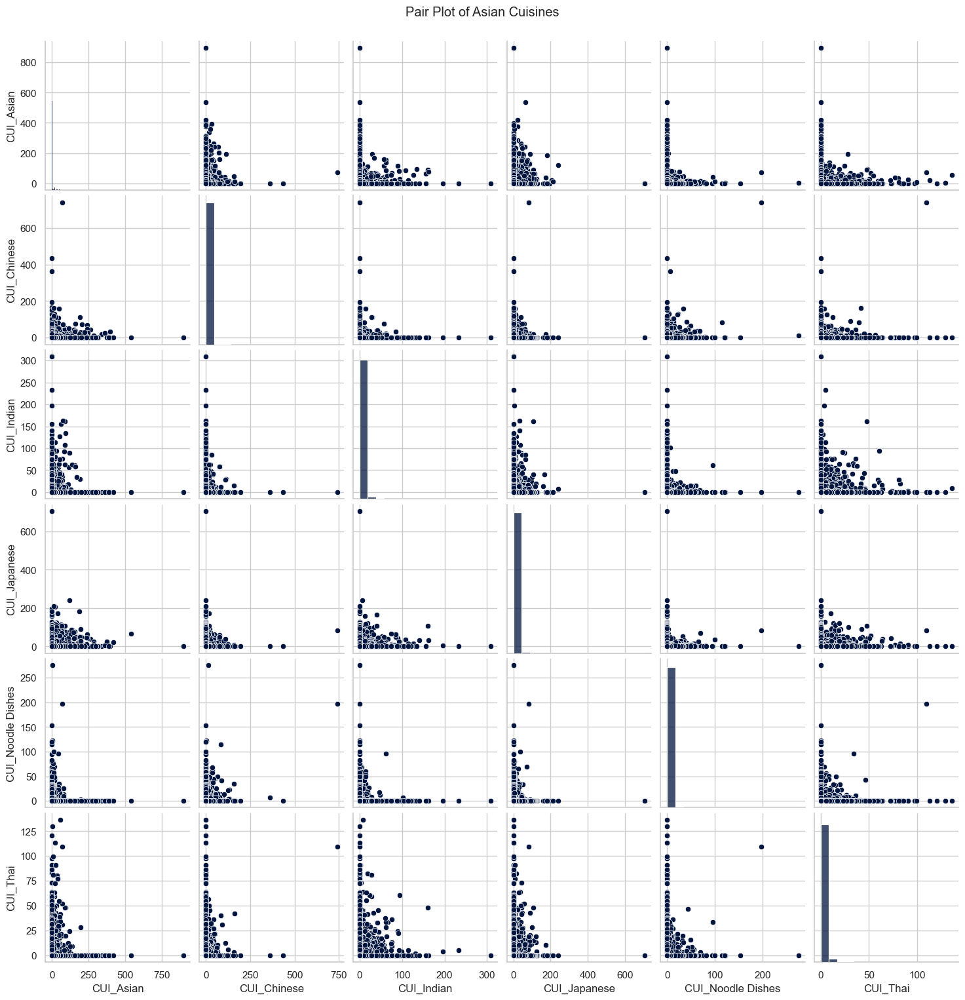

In [318]:
pair_plot = sns.pairplot(data, 
                         vars=['CUI_Asian', 'CUI_Chinese', 'CUI_Indian', 'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_Thai'],
                         plot_kws={'color': '#01153E'},
                         diag_kws={'color': '#01153E'})

pair_plot.fig.suptitle('Pair Plot of Asian Cuisines', y=1.02)

plt.show()

c:\Users\Carolina\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


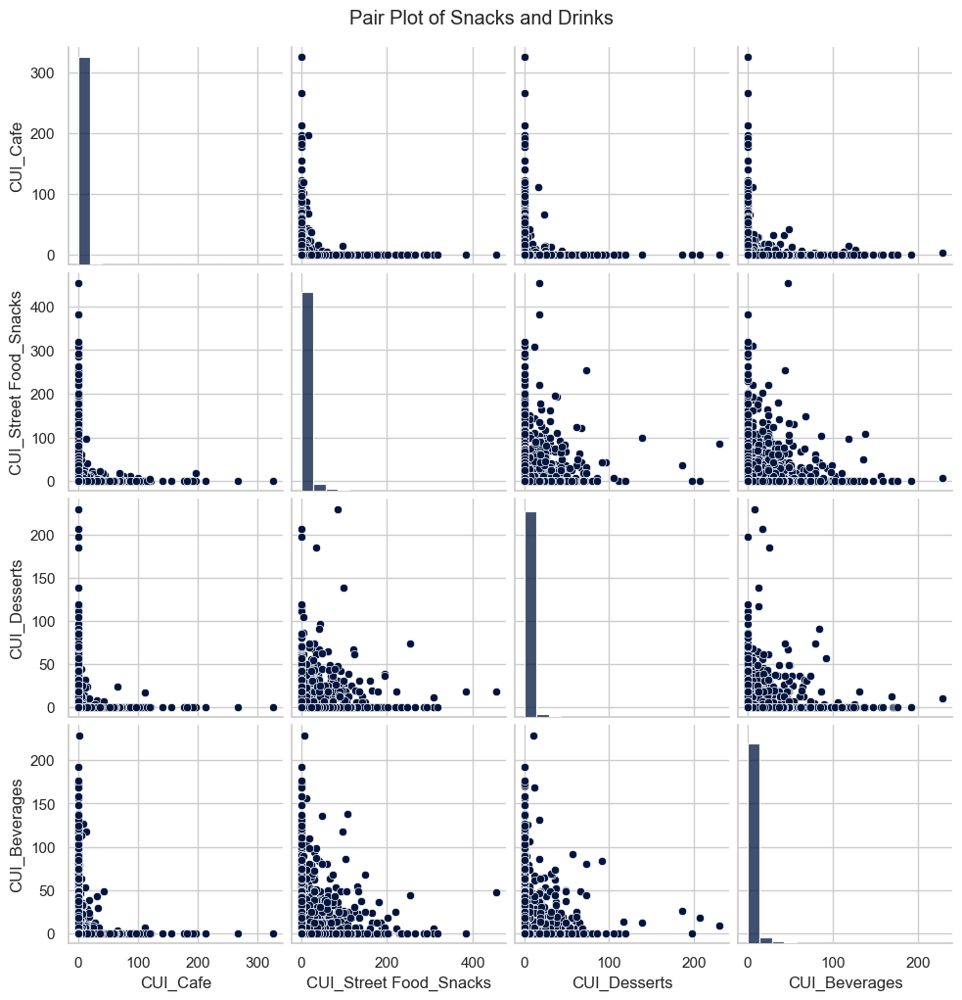

In [319]:
pair_plot = sns.pairplot(data, 
                         vars=['CUI_Cafe', 'CUI_Street Food_Snacks', 'CUI_Desserts', 'CUI_Beverages'],
                         plot_kws={'color': '#01153E'},    
                         diag_kws={'color': '#01153E'})    


pair_plot.fig.suptitle('Pair Plot of Snacks and Drinks', y=1.02)

plt.show()

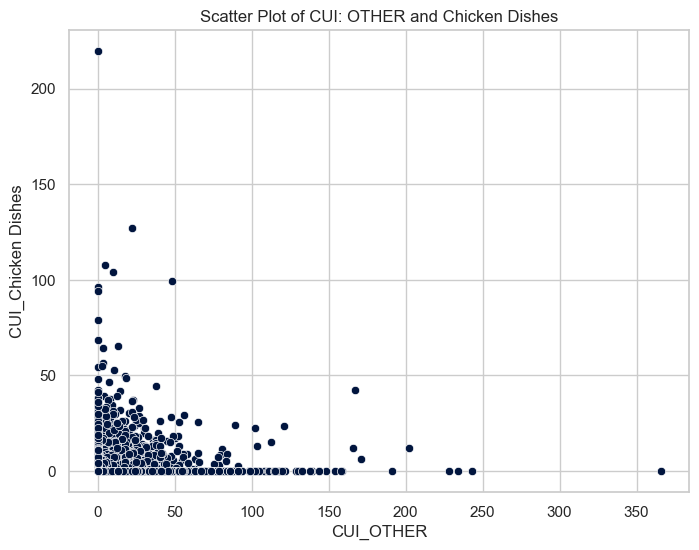

In [320]:
plt.figure(figsize=(8, 6))

sns.scatterplot(data=data, x='CUI_OTHER', y='CUI_Chicken Dishes', color='#01153E')  

plt.title('Scatter Plot of CUI: OTHER and Chicken Dishes')
plt.xlabel('CUI_OTHER')
plt.ylabel('CUI_Chicken Dishes')

plt.show()

The cuisines we thought that might be similar to group don't seem to have any linear relation, so it would not be wise to group them.

**Correlation Matrices** (we used Pearson method)

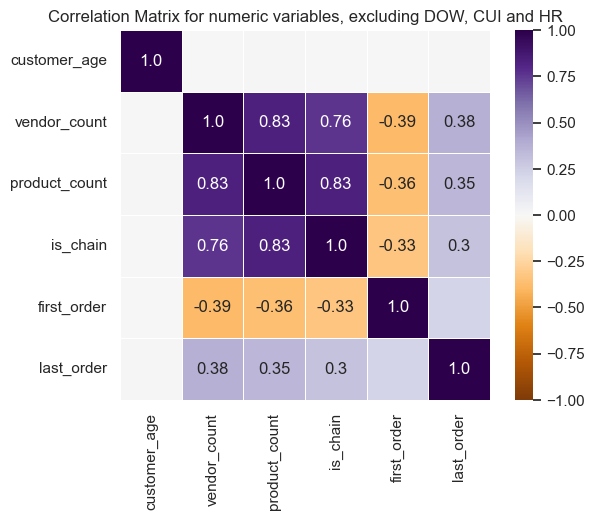

In [321]:
corr = data[['customer_age', 'vendor_count', 'product_count', 'is_chain',
       'first_order', 'last_order']].corr(method="pearson").round(2)
mask_annot = np.absolute(corr.values) >= 0.3
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

sns.heatmap(data=corr, annot=annot,  cmap='PuOr',  fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5)
plt.title('Correlation Matrix for numeric variables, excluding DOW, CUI and HR')
plt.show()

This correlation matrix indicates that, as stated before with the pairplots, product_count, vendor_count and is_chain are highly correlated. Moreover, first_order has a positive relation with these latter variables, indicating that the later the customer placed the last order, the higher the number of products he bought and the higher the number of vendors he ordered from. The same rationale can be applied to the relation with first order, as the later the customer placed his first order, the lower the number of products he bought and the higher the number of vendors he ordered from. So customers with a low first order and a high last order are likely loyal customers and buy from a wider range of vendors.

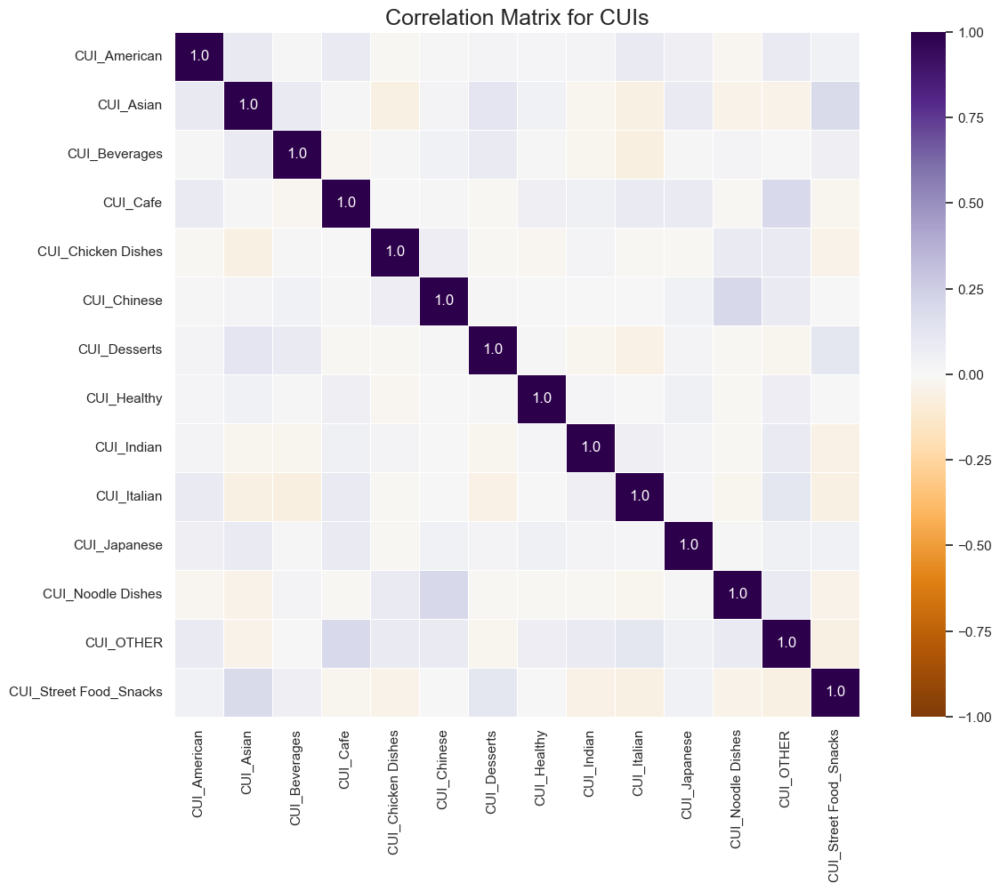

In [322]:
fig = plt.figure(figsize=(15, 10))
corr = data[cuisine_columns].corr(method="pearson").round(2)
mask_annot = np.absolute(corr.values) >= 0.3
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

sns.heatmap(data=corr, annot=annot,  cmap='PuOr',  fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5)
plt.title('Correlation Matrix for CUIs', fontsize=18)
plt.show()

There are not meaningfull correlations between cuisines, as stated above with the pairplots.

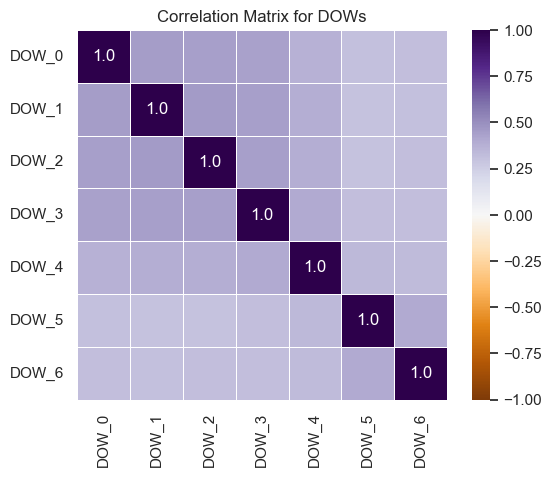

In [323]:
corr = data[dow_columns].corr(method="pearson").round(2)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

sns.heatmap(data=corr, annot=annot,  cmap='PuOr',  fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5)

plt.title('Correlation Matrix for DOWs')
plt.show()

Regarding the days of the week variables, there are also not meaningfull correlations.
So we group by weekend and week days.

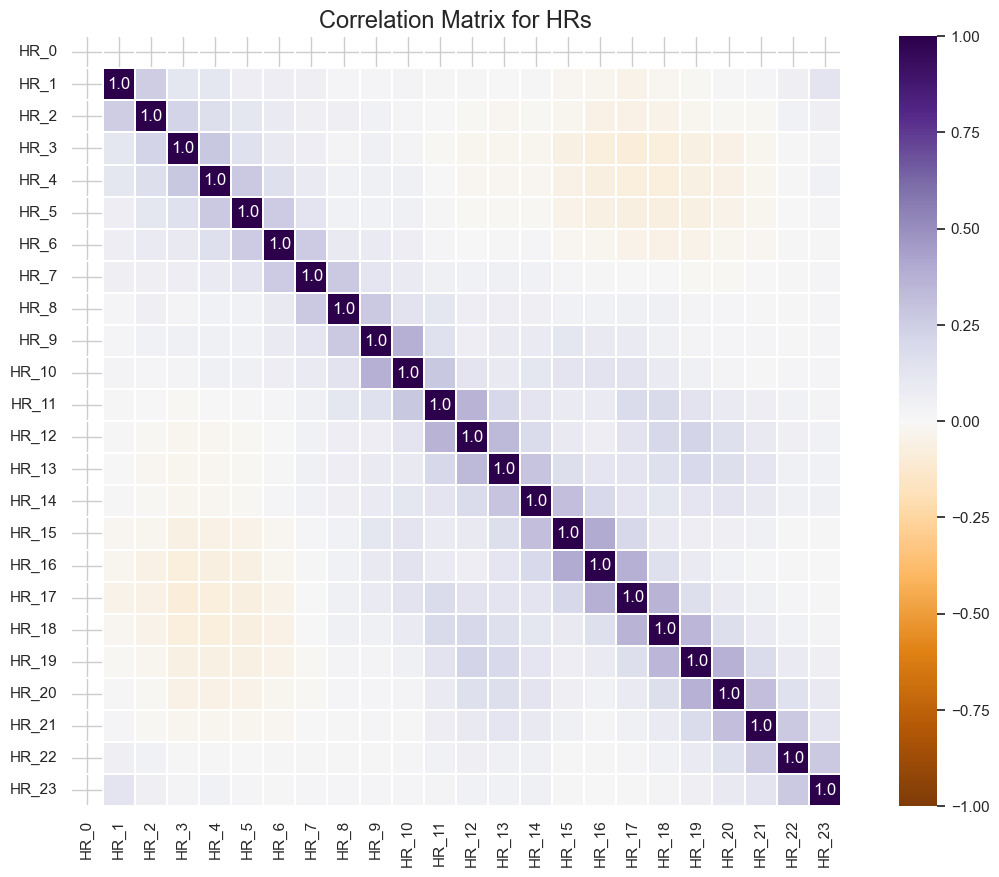

In [324]:
fig = plt.figure(figsize=(15, 10))
corr = data[hr_columns].corr(method="pearson").round(2)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

sns.heatmap(data=corr, annot=annot,  cmap='PuOr',  fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=.2)

plt.title('Correlation Matrix for HRs', fontsize=17)
plt.show()

The correlation matrix shows stronger correlations within consecutive hours, especially in the described peaking slots.

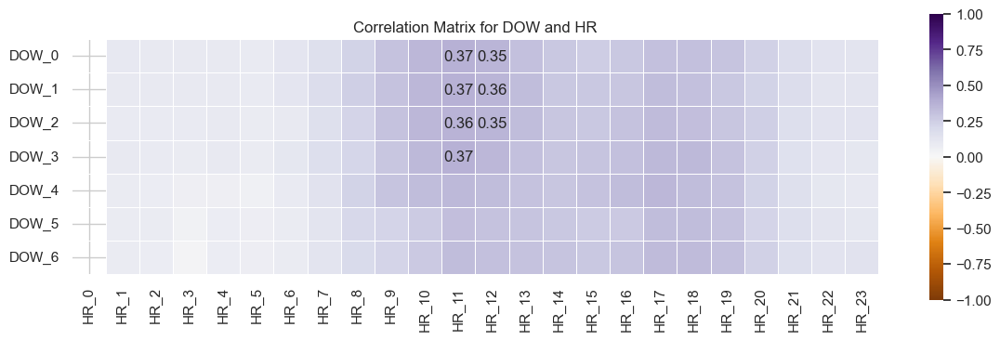

In [325]:
#This was generated with the help of chat GPT
correlation_matrix = data[dow_columns + hr_columns].corr().loc[dow_columns, hr_columns]

mask_annot = np.abs(correlation_matrix.values) >= 0.35
annot = np.where(mask_annot, correlation_matrix.round(2).values, "")

plt.figure(figsize=(14, 4))
sns.heatmap(data=correlation_matrix, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
plt.title('Correlation Matrix for DOW and HR')
plt.show()

This correlation matrix shows that the hours the customers place orders do not change across the week. As seen in visualizations above and proven here, customers place orders mostly between 10-13 and 16-19.

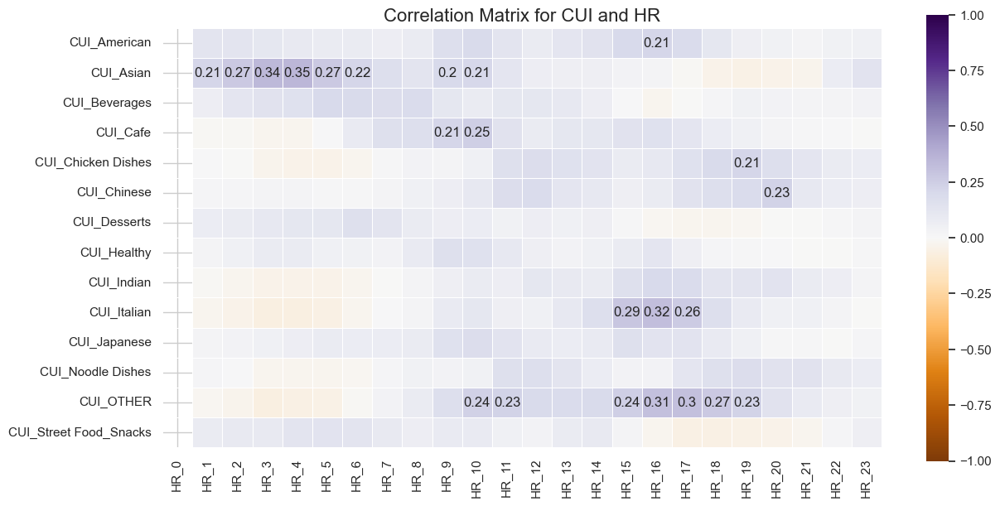

In [326]:
correlation_matrix = data[cuisine_columns + hr_columns].corr().loc[cuisine_columns, hr_columns]

mask_annot = np.abs(correlation_matrix.values) >= 0.2
annot = np.where(mask_annot, correlation_matrix.round(2).values, "")

plt.figure(figsize=(14, 7))
sns.heatmap(data=correlation_matrix, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
plt.title('Correlation Matrix for CUI and HR', fontsize=16)
plt.show()

This correlation matrix shows that customers buy the asian type of cuisine specially at dawn. Besides this, between 16h-17h customers buy specially from italian CUI and other CUI. This indicates that the customers cuisine preferences can help distinguish the time of day when they order the most.

## 4. NEW FEATURES/FEATURE ENGINEERING

In [327]:
data.columns

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food_Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23'],
      dtype='object')

We create a copy of the data set in order to not change the columns of the original data set.

In [328]:
data2 = data.copy()

#### 4.1. AGREGATING FEATURES

We group hours of the day according to the trends we can observe on visualizatios, since, as seen above, there are no significant correlations between them.

In [329]:
data2['dawn'] = data[['HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7']].sum(axis=1)

data2['morning'] = data[['HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13']].sum(axis=1)

data2['afternoon'] = data[['HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19']].sum(axis=1)

data2['night'] = data[['HR_20', 'HR_21', 'HR_22', 'HR_23', 'HR_0', 'HR_1']].sum(axis=1)

In [330]:
time_columns=['dawn', 'morning', 'afternoon', 'night']

We group by weekend and weekday as to then evaluate which time of the week, weekend or weekdays, our customers prefer.

In [331]:
data2['weekday'] = data[['DOW_1', 'DOW_2','DOW_3', 'DOW_4']].sum(axis=1)

data2['weekend'] = data[['DOW_0', 'DOW_5','DOW_6']].sum(axis=1)

In [332]:
week_columns = ['weekday', 'weekend']

Next, we drop the features that made the new ones

In [333]:
data2.drop(['HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5','HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11','HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17','HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23'], axis=1, inplace=True)

In [334]:
data2.drop(['DOW_0','DOW_1','DOW_2','DOW_3','DOW_4','DOW_5','DOW_6'], axis = 1, inplace=True)

#### 4.2 CREATING NEW FEATURES

In [335]:
data2['total_spending'] = data[['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food_Snacks', 'CUI_Thai']].sum(axis=1)

In [336]:
data2['total_orders'] = (data2['weekday']+data2['weekend'])

In [337]:
data2['used_promo'] = data2['last_promo'].apply(lambda x: 0 if x=='-' else 1)

In [338]:
data2['broader_region'] = data2['customer_region'].apply(lambda x: list(map(int, str(x)))[0] if x!='-' else 8)
#here we are assuming that the region '-' belongs to the broader region 8 once it has a similar distribution to the regions that start with 8, as seen above and has it will be seen in the following visualizations

In [339]:
data2['order_frequency'] = (data['last_order'] - data['first_order']) / (data2['total_orders'])

In [340]:
data2['order_span'] = data['last_order'] - data['first_order']

To create average product cost we will drop the incoherences with product count (the rows that have this value equal to zero - 156) so that we don't have a division by zero. Further on, once the inconsistences mentioned above are treated, this step will not be necessary.

In [341]:
data2=data2[data2['product_count']!=0]

In [342]:
data2['avg_product_cost'] = (data2['total_spending'])/data2['product_count']

In [343]:
data2['avg_order_cost'] = data2['total_spending']/data2['total_orders']

In [344]:
data2['products_per_vendor'] = (data2['product_count'])/data2['vendor_count']

In [345]:
data2['CUI_diversity_score'] = (data2[['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food_Snacks', 'CUI_Thai']].applymap(lambda x: 1 if x!=0 else 0).sum(axis=1))

Next, we drop the features that were used directly to create new ones

In [346]:
data2.drop(['last_promo'], axis=1, inplace=True)

In [347]:
data2.drop(['last_order', 'first_order'], axis=1, inplace=True)

We will agregate numeric and categorical features

In [348]:
new_num_features = ['dawn', 'morning', 'afternoon', 'night', 'weekday', 'weekend', 'total_spending', 'total_orders', 'order_frequency', 'order_span', 'avg_product_cost', 'avg_order_cost', 'products_per_vendor', 'CUI_diversity_score']

In [349]:
new_cat_features=['used_promo', 'broader_region']

In [350]:
new_features=new_num_features+new_cat_features

In [351]:
data2[new_cat_features]=data2[new_cat_features].astype(str) #turning the categorical features into objects

In [352]:
data2[new_features].info()

<class 'pandas.core.frame.DataFrame'>
Index: 31719 entries, 1b8f824d5e to fd40d3b0e0
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   dawn                 31719 non-null  int64  
 1   morning              31719 non-null  int64  
 2   afternoon            31719 non-null  int64  
 3   night                31719 non-null  float64
 4   weekday              31719 non-null  int64  
 5   weekend              31719 non-null  int64  
 6   total_spending       31719 non-null  float64
 7   total_orders         31719 non-null  int64  
 8   order_frequency      31613 non-null  float64
 9   order_span           31613 non-null  float64
 10  avg_product_cost     31719 non-null  float64
 11  avg_order_cost       31719 non-null  float64
 12  products_per_vendor  31719 non-null  float64
 13  CUI_diversity_score  31719 non-null  int64  
 14  used_promo           31719 non-null  object 
 15  broader_region       31719 

In [353]:
data2[new_num_features].describe().T

,count,mean,std,min,25%,50%,75%,max
dawn,31719.0,0.513888,1.302014,0.00,0.000000,0.00,0.000000,29.00
morning,31719.0,1.632176,2.705619,0.00,0.000000,1.00,2.000000,58.00
afternoon,31719.0,1.831899,2.876418,0.00,0.000000,1.00,2.000000,61.00
night,31719.0,0.363063,1.059236,0.00,0.000000,0.00,0.000000,43.00
weekday,31719.0,2.467543,3.195702,0.00,1.000000,2.00,3.000000,59.00
weekend,31719.0,1.922412,2.446373,0.00,1.000000,1.00,2.000000,44.00
total_spending,31719.0,38.478252,46.450736,0.37,13.030000,24.20,45.225000,1418.33
total_orders,31719.0,4.389956,5.088440,1.00,2.000000,3.00,5.000000,94.00
order_frequency,31613.0,8.510307,7.887965,0.00,1.500000,7.20,12.750000,44.50
order_span,31613.0,35.589662,29.382506,0.00,4.000000,34.00,62.000000,90.00


In [354]:
data2[new_cat_features].describe(include='O')

,used_promo,broader_region
count,31719,31719
unique,2,3
top,0,2
freq,16689,10757


#### 4.3. VISUALIZATIONS WITH THE NEW FEATURES

**Bar plots** for the new categorical features

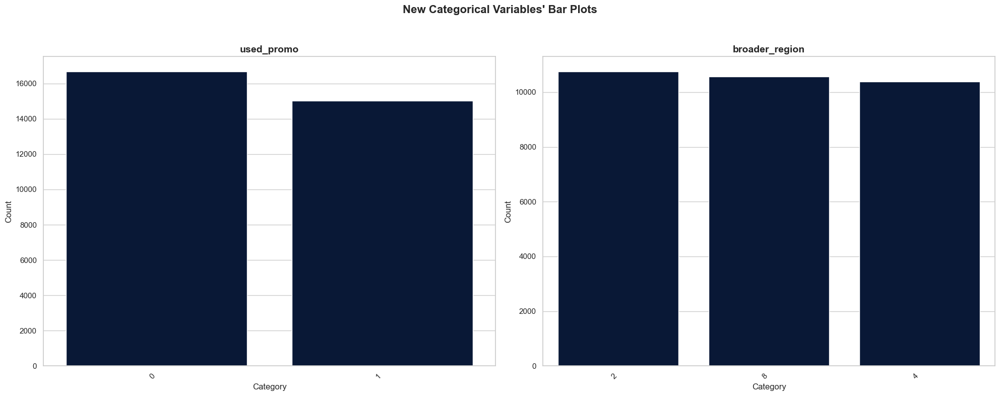

In [355]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(1, len(new_cat_features), figsize=(20, 8))

for ax, feat in zip(axes.flatten(), new_cat_features):
    count_data = data2[feat].value_counts().sort_values(ascending=False)

    sns.barplot(x=count_data.index, y=count_data.values, ax=ax, color='#01153E')

    ax.set_title(feat, fontsize=14, fontweight='bold')
    ax.set_xlabel('Category', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.suptitle("New Categorical Variables' Bar Plots", fontsize=16, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.95]) 

plt.show()

There are more customers not using promotions. Besides, our customers are almost evenly distributed among the 3 broader regions.

**Boxplot and histograms** for the new numerical features

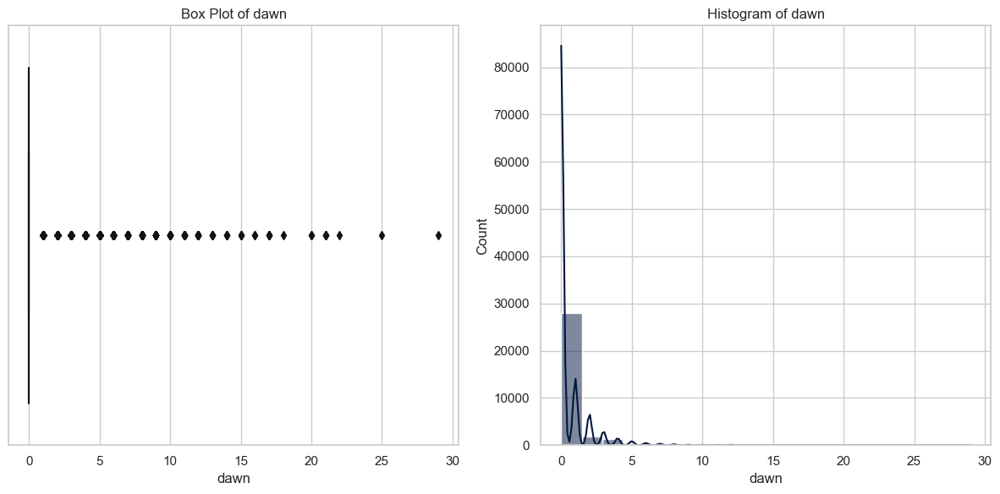

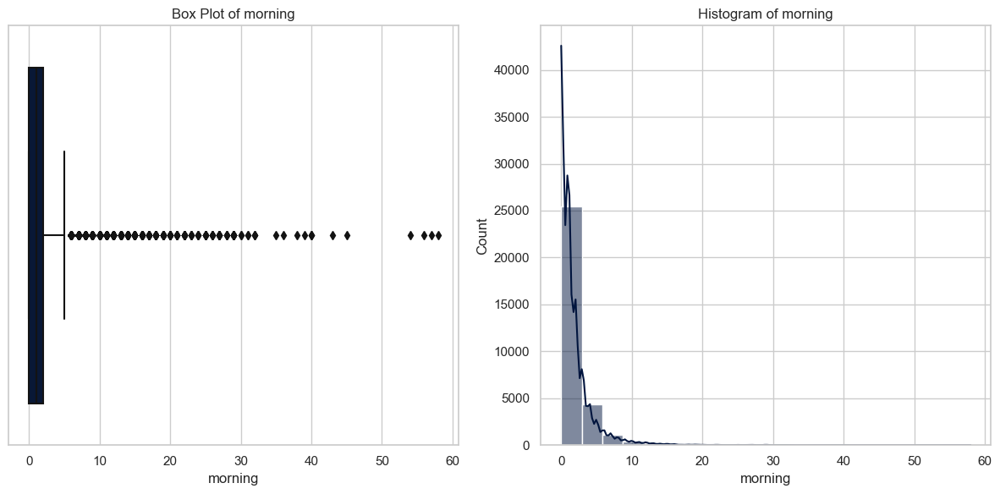

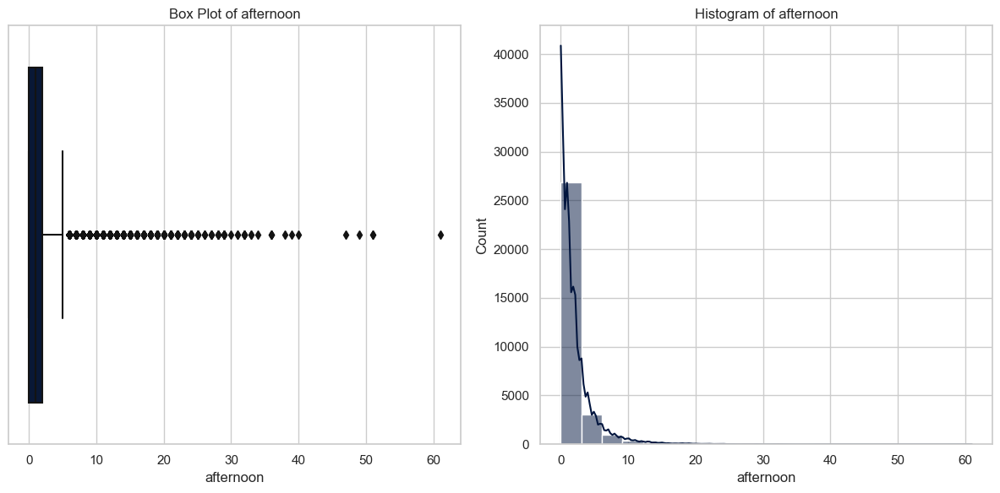

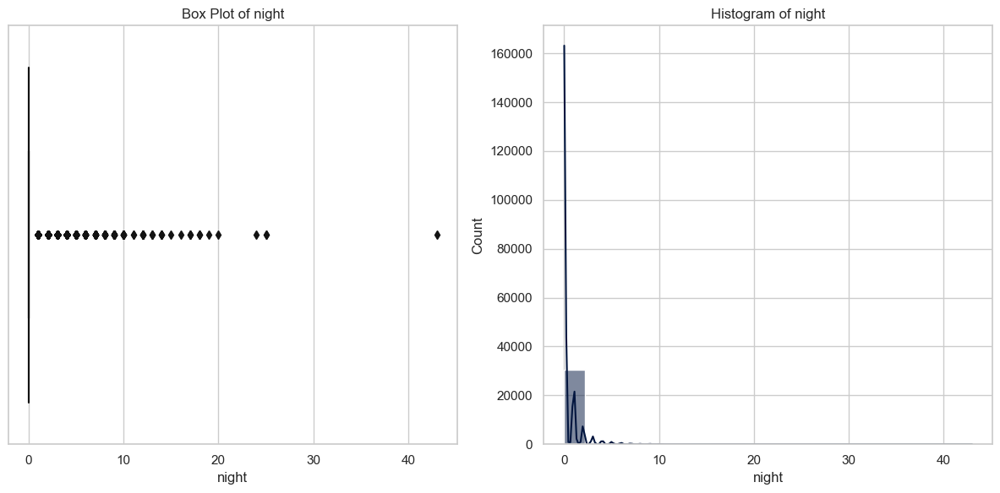

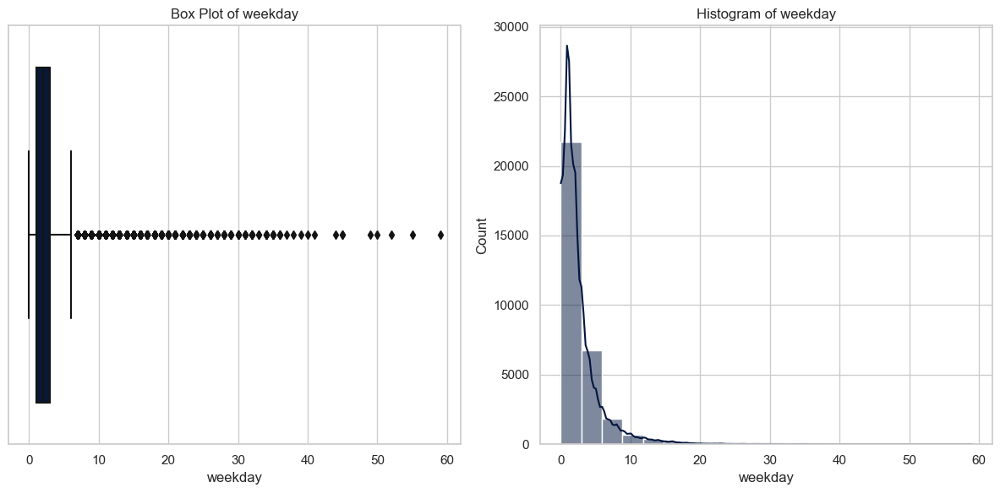

...

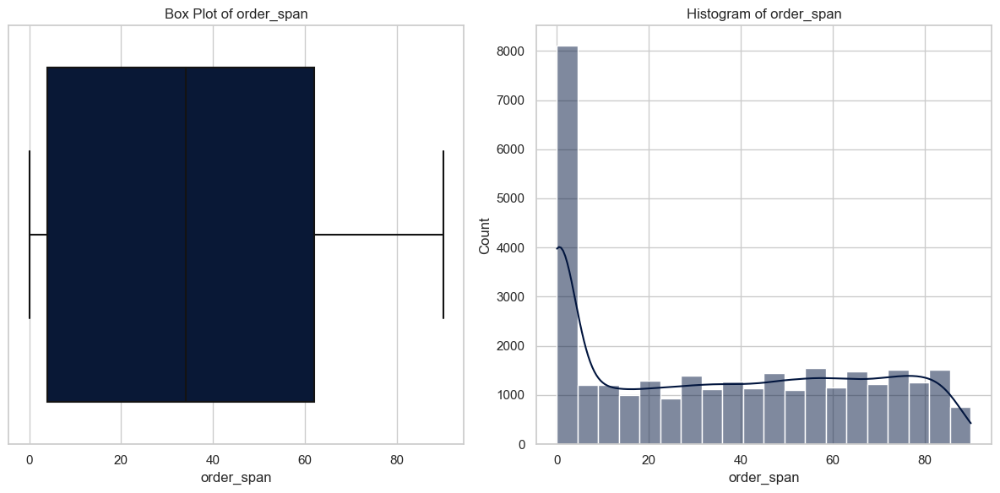

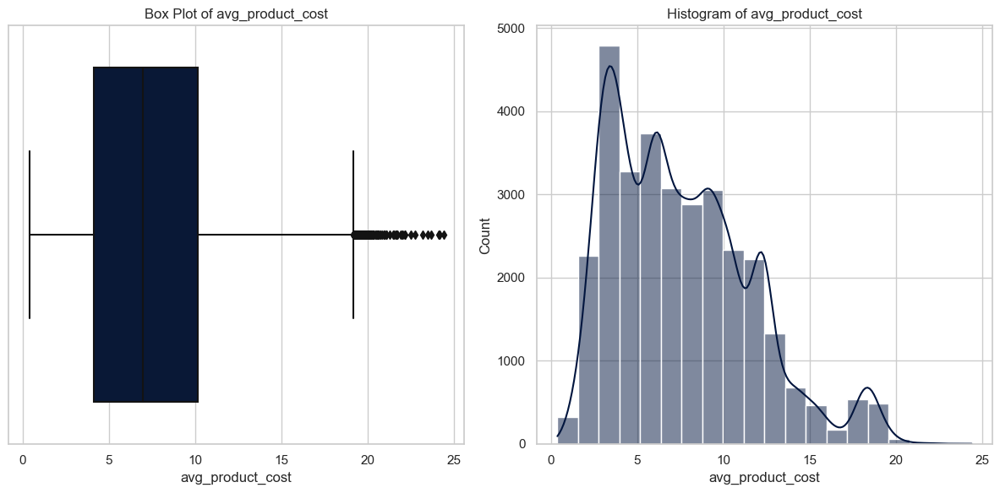

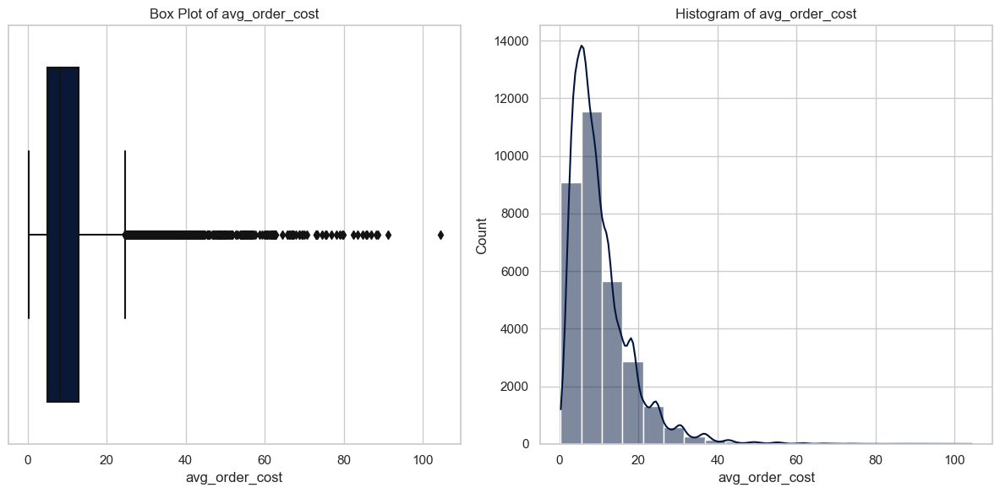

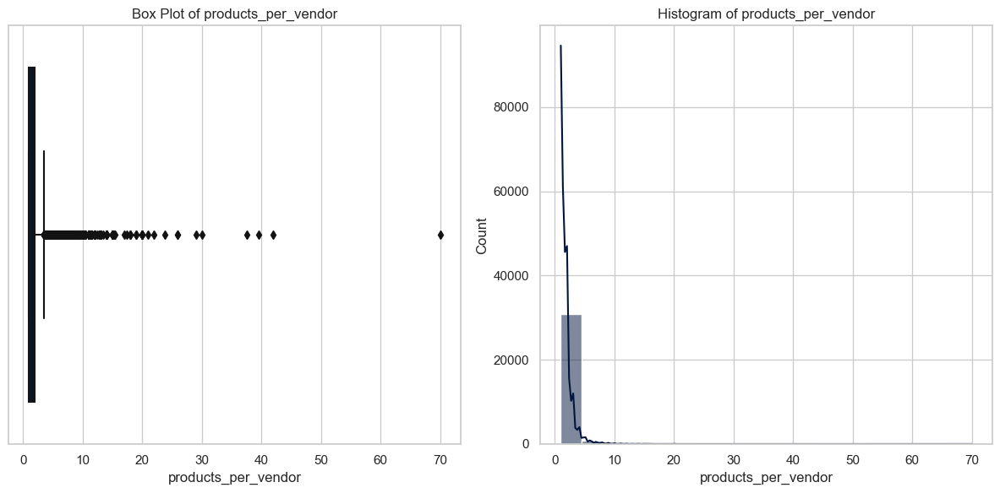

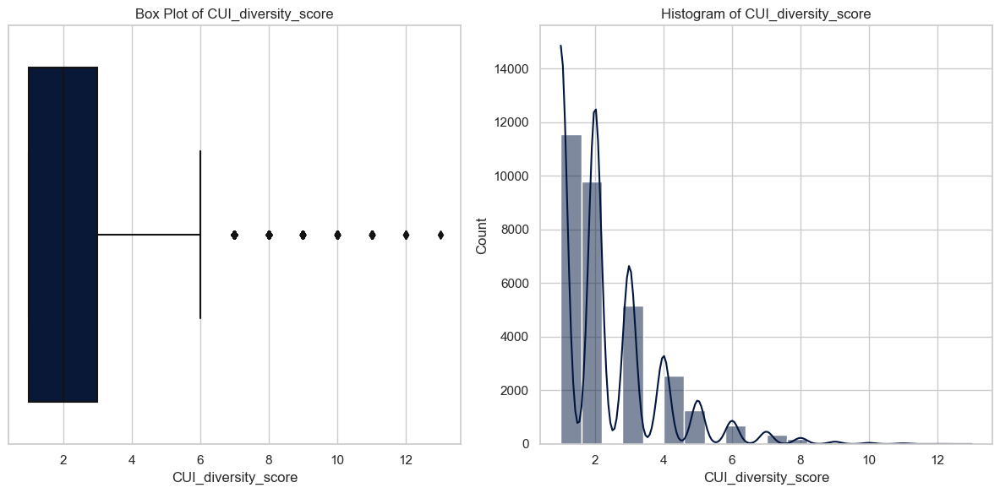

In [356]:
for column in new_num_features:
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.boxplot(x=data2[column], color='#01153E')
    plt.title(f'Box Plot of {column}')

    plt.subplot(1, 2, 2)
    sns.histplot(data2[column], bins=20, kde=True, color='#01153E')
    plt.title(f'Histogram of {column}')

    plt.tight_layout()

    plt.savefig(f'{column}_plot.png', format='png', dpi=300, bbox_inches='tight')

    plt.show()

We will return to this statistics and visualizations later in the project. The boxplots regarding time slots of the day are now more insightful.

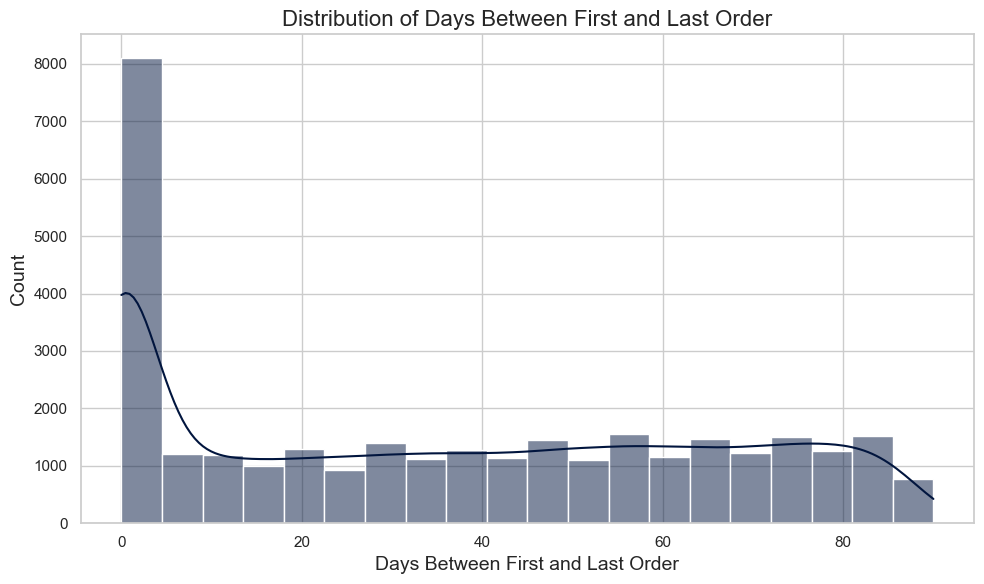

In [357]:
plt.figure(figsize=(10, 6))
sns.histplot(data2['order_span'], bins=20, kde=True, color='#01153E')
plt.title('Distribution of Days Between First and Last Order', fontsize=16)
plt.xlabel('Days Between First and Last Order', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.tight_layout()
plt.show()

The majority of customers have a difference of zero days, meaning many customers placed orders in a single day during the period of our dataset, and we can see that we have a lot of single usage clients. This information suggests a little engaging customer base, where many clients do not return for additional orders. Then we have a relatively uniform spread of customers with progressively longer intervals between their first and last orders. Our set of customers is very diverse in their activity but single usage clients are an issue.

There appears to be a slight upward trend, that indicates that as the number of days between the first and last orders increases (customers are more regulars), there is a small tendency for the product count to increase. This might suggest that customers who stay active over a longer period tend to order more products overall.

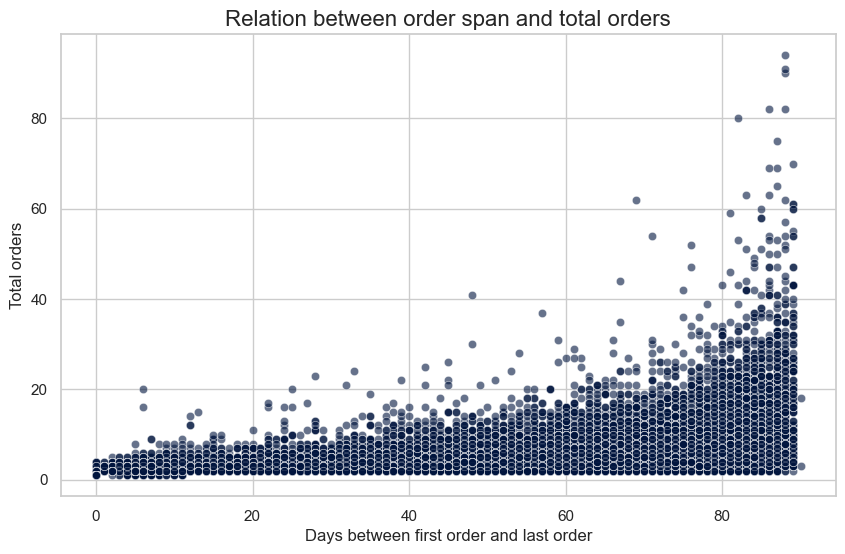

In [358]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x='order_span', y='total_orders', data=data2, alpha=0.6, color='#01153E')

plt.title('Relation between order span and total orders', fontsize=16)
plt.xlabel('Days between first order and last order')
plt.ylabel('Total orders')

plt.show()

Customers with higher days between first order and last order tend to place more orders compared to those with lower difference days between first order and last order. This means that high difference between last and first order represents recurrent customers.

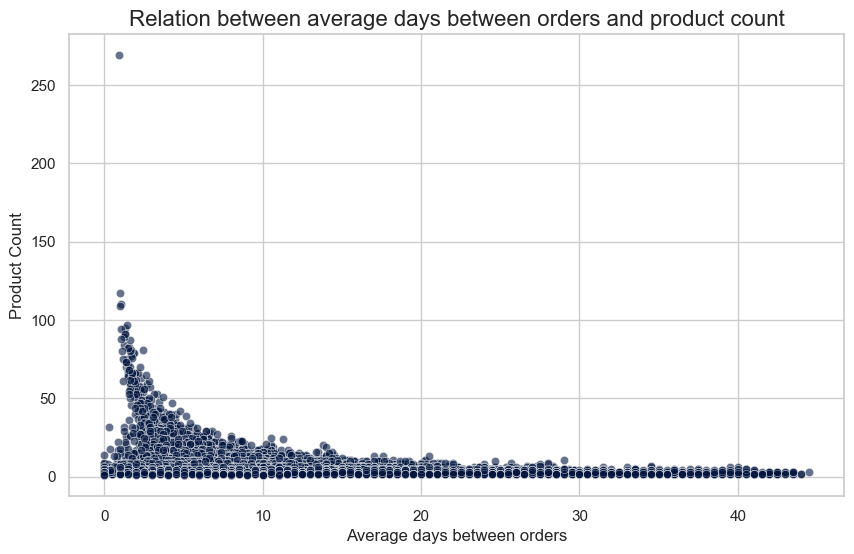

In [359]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x='order_frequency', y='product_count', data=data2, alpha=0.6,color='#01153E')

plt.title('Relation between average days between orders and product count', fontsize=16)
plt.xlabel('Average days between orders')
plt.ylabel('Product Count')

plt.show()

Also, logically, the costumers that have a low average of days between orders, this is, that order often, have a high number of products ordered.

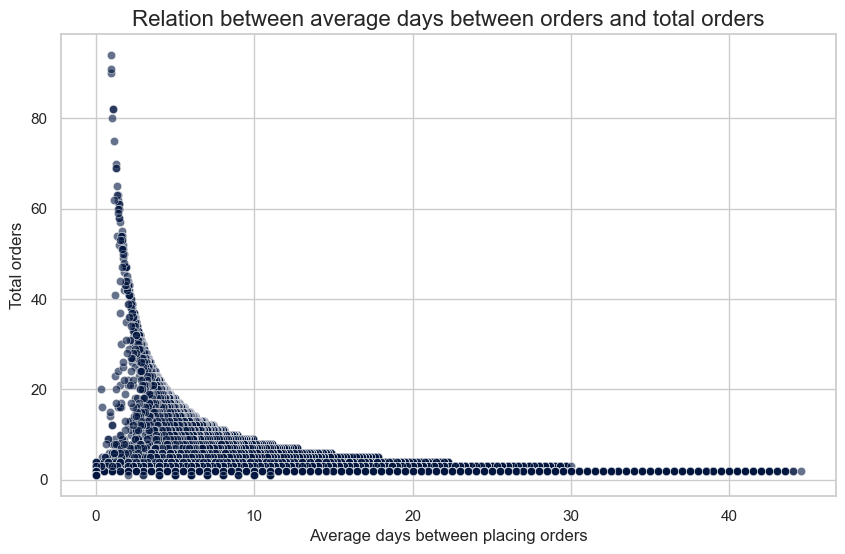

In [360]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x='order_frequency', y='total_orders', data=data2, alpha=0.6, color='#01153E')

plt.title('Relation between average days between orders and total orders', fontsize=16)
plt.xlabel('Average days between placing orders')
plt.ylabel('Total orders')

plt.show()

As expected, costumers that order more frequently, this is, with an average of less days in between orders, have a much higher total order count. 

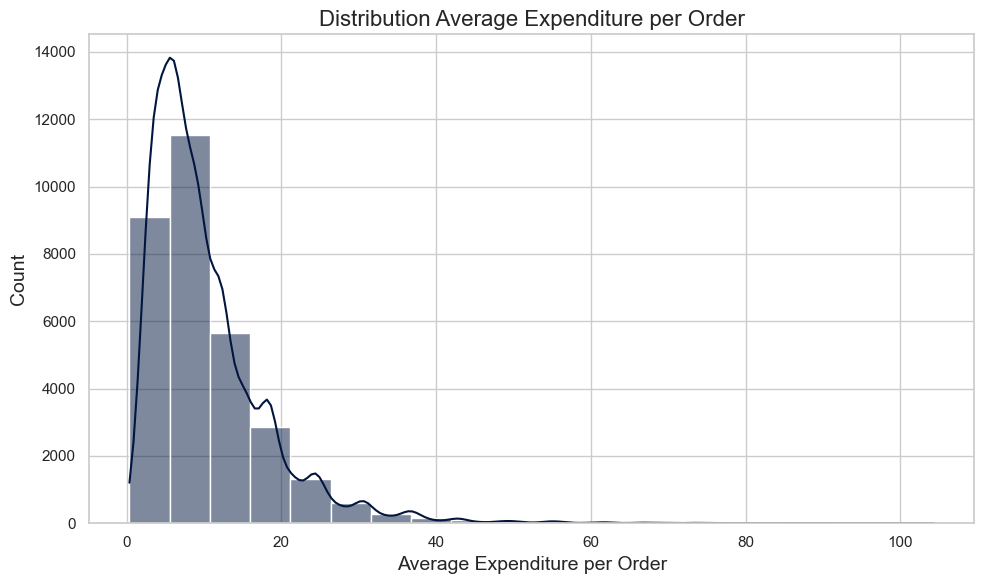

In [361]:
plt.figure(figsize=(10, 6))
sns.histplot(data2['avg_order_cost'], bins=20, kde=True, color='#01153E')
plt.title('Distribution Average Expenditure per Order', fontsize=16)
plt.xlabel('Average Expenditure per Order', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.tight_layout()
plt.show()

The distribution is heavily right-skewed. The majority of customers spend a lower amount per order. This suggests that the majority of orders fall within a lower expenditure range, with only a few high-spending outliers. It would be useful to find out who are the outliers and how to keep them in our customer set.

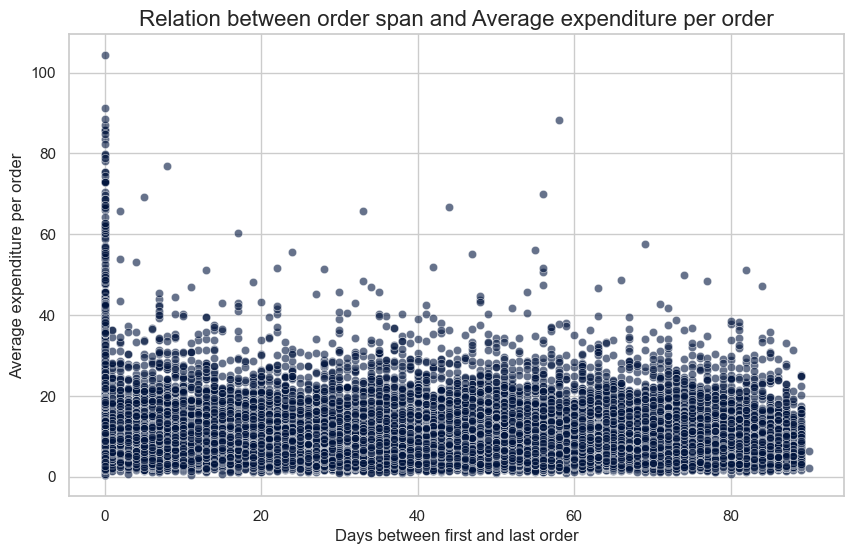

In [362]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x='order_span', y='avg_order_cost', data=data2, alpha=0.6, color='#01153E')

plt.title('Relation between order span and Average expenditure per order', fontsize=16)
plt.xlabel('Days between first and last order')
plt.ylabel('Average expenditure per order')

plt.show()

This visualization tells us that the average amount spent per order does not significantly change regardless of how long the customer has been active.

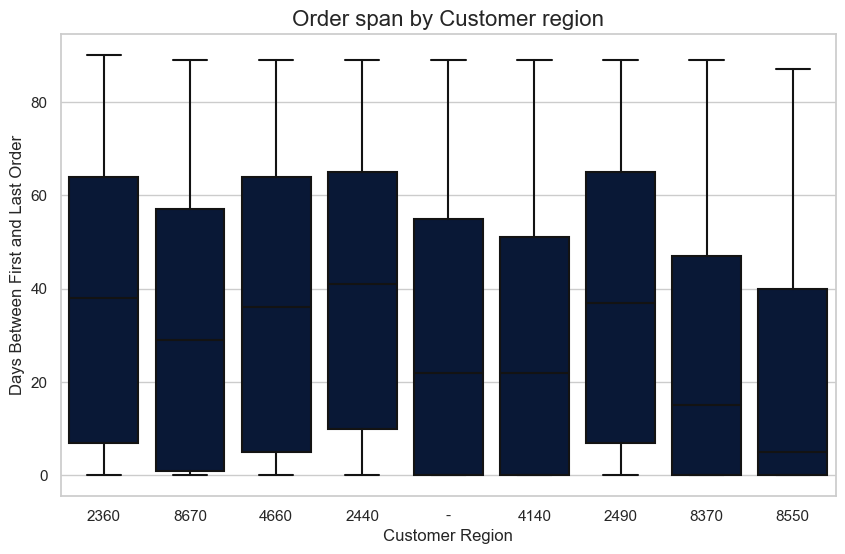

In [363]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='customer_region', y='order_span', data=data2, color='#01153E')
plt.title('Order span by Customer region', fontsize=16)
plt.xlabel('Customer Region')
plt.ylabel('Days Between First and Last Order')
plt.show()

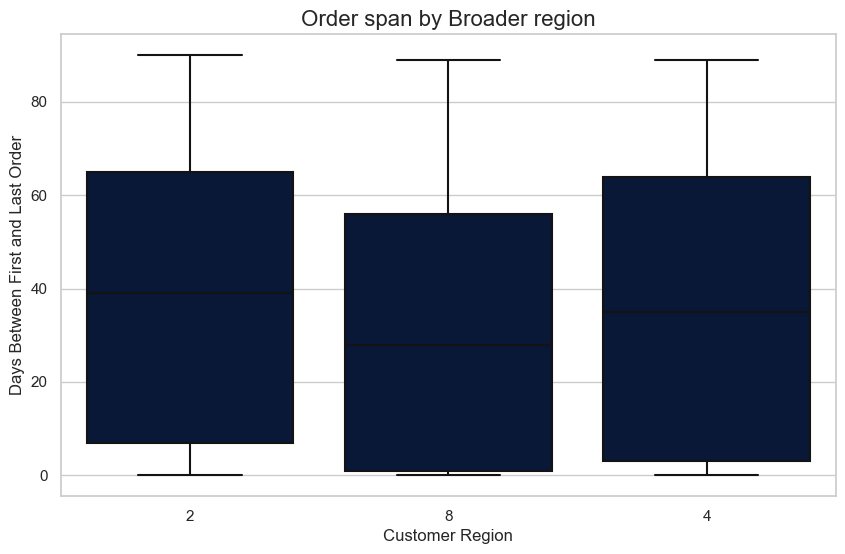

In [364]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='broader_region', y='order_span', data=data2, color='#01153E')
plt.title('Order span by Broader region', fontsize=16)
plt.xlabel('Customer Region')
plt.ylabel('Days Between First and Last Order')
plt.show()

Broader region 8 have a slightly lower difference between first and last order compared with the broader regions 2 and 4. This can lead us to think that region 2 and 4 have more loyal customers than 8.

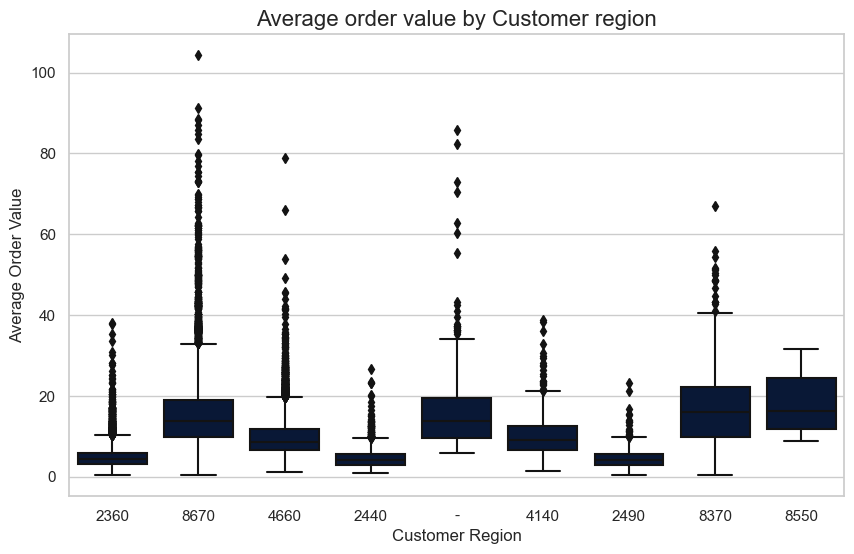

In [365]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='customer_region', y='avg_order_cost', data=data2, color='#01153E')
plt.title('Average order value by Customer region', fontsize=16)
plt.xlabel('Customer Region')
plt.ylabel('Average Order Value')
plt.show()

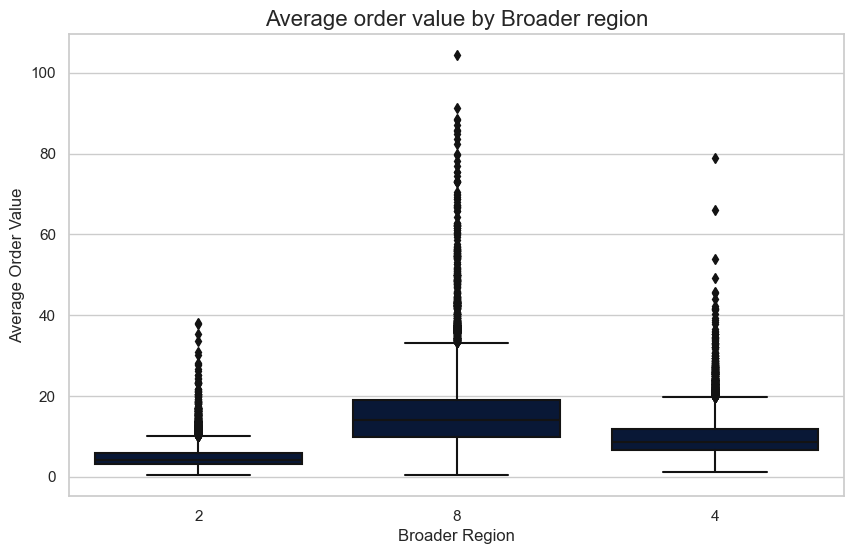

In [366]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='broader_region', y='avg_order_cost', data=data2, color='#01153E')
plt.title('Average order value by Broader region', fontsize=16)
plt.xlabel('Broader Region')
plt.ylabel('Average Order Value')
plt.show()

The broader region 8 has a higher average order value compared to the other broader regions. Once again, the region '-' has a very similar behaviour when it comes to order value of the broader region 8. Broader region 2 has clearly a significant lower average order value. This could be related to the type of cuisine the customers from each region prefer.

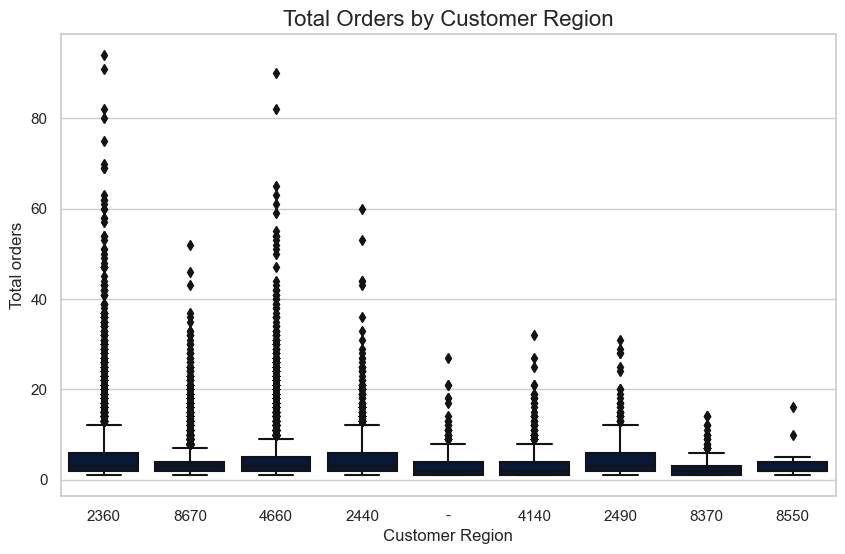

In [367]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='customer_region', y='total_orders', data=data2, color='#01153E')
plt.title('Total Orders by Customer Region', fontsize=16)
plt.xlabel('Customer Region')
plt.ylabel('Total orders')
plt.show()

The number of total orders placed by customers doens't seem to differ from region to region.

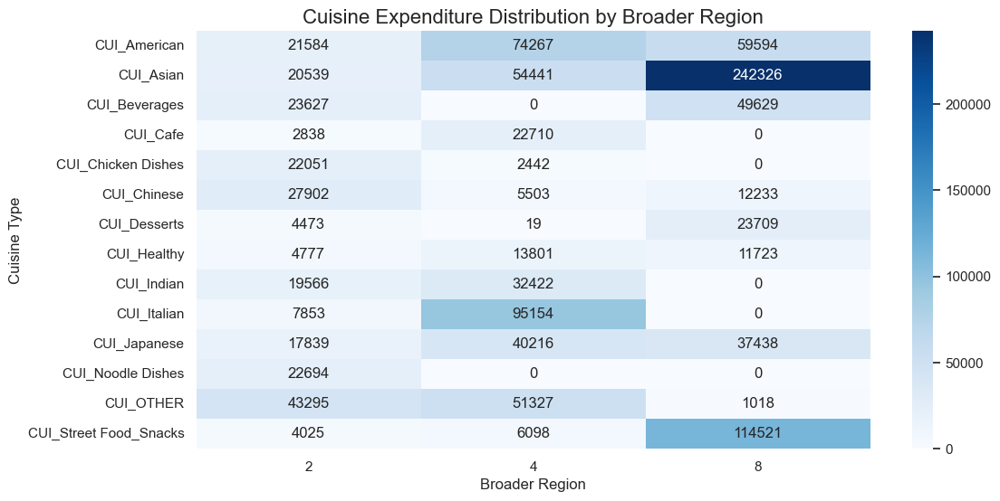

In [368]:
#This was generated with the help of chat GPT
cuisine_by_region = np.transpose(data2.groupby('broader_region')[cuisine_columns].sum())

plt.figure(figsize=(12, 6))
sns.heatmap(cuisine_by_region, annot=True, cmap="Blues", fmt=".0f")
plt.title('Cuisine Expenditure Distribution by Broader Region', fontsize=16)
plt.ylabel('Cuisine Type')
plt.xlabel('Broader Region')
plt.show()

By this table, we can state that in region 2 the cuisines preferences are equally distributed. In region 4, there is a preference for italian and american and a clearly disinterest in buying Beverages, Desserts and Noodles Dishes. In broader region 8 the customers spend more in Asian cuisine and in street food and snacks, and, contrastly, they don't buy at all Thai food, Noodles Dishes, Italian, Indian, Chicken Dishes, and Cafe cuisines. This may be very good to custumer segmentation, as there are clearly different preferences across the different regions.

Text(0.5, 1.0, 'Total spending by Used promo')

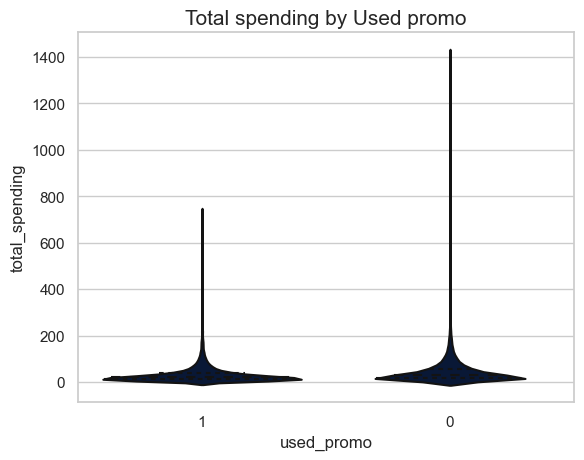

In [369]:
sns.violinplot(x='used_promo', y='total_spending', data=data2, inner='quartile',color='#01153E')
plt.title('Total spending by Used promo', fontsize=15)

We might think that promotion usage could be related to higher spending due to promotion incentive to consume but that is not the case with our customer base. The shapes of the distributions are quite similar for both groups, what suggests that the spending patterns of customers who used promotions are not significantly different from those who didn’t. This could imply that using promotions doesn't necessarily correlate with higher or lower total spending. Non-promo users (0) have more extreme high-spending outliers, which means that high-spending customers do not rely on promotions.

Both groups have the majority of spending values concentrated around the lower end of the scale, what is reflected by the thick parts of the violins around lower spending values, which is also consistent with previous findings.


Text(0.5, 1.0, 'Total orders by Used promo')

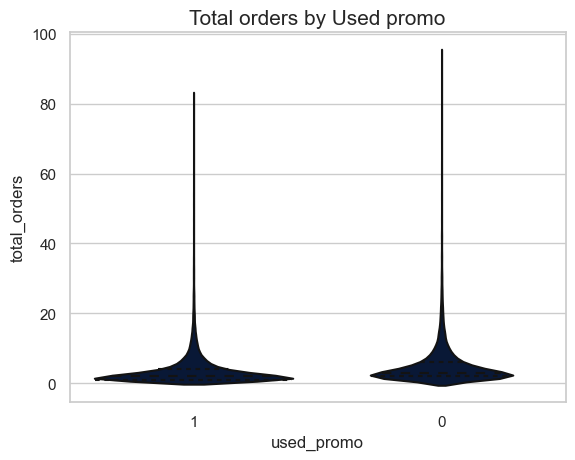

In [370]:
sns.violinplot(x='used_promo', y='total_orders', data=data2, inner='quartile',color='#01153E')
plt.title('Total orders by Used promo', fontsize=15)

Similar conclusions can be drawn to the relationship between if the customer has used a promotion or not and the amount of orders placed.

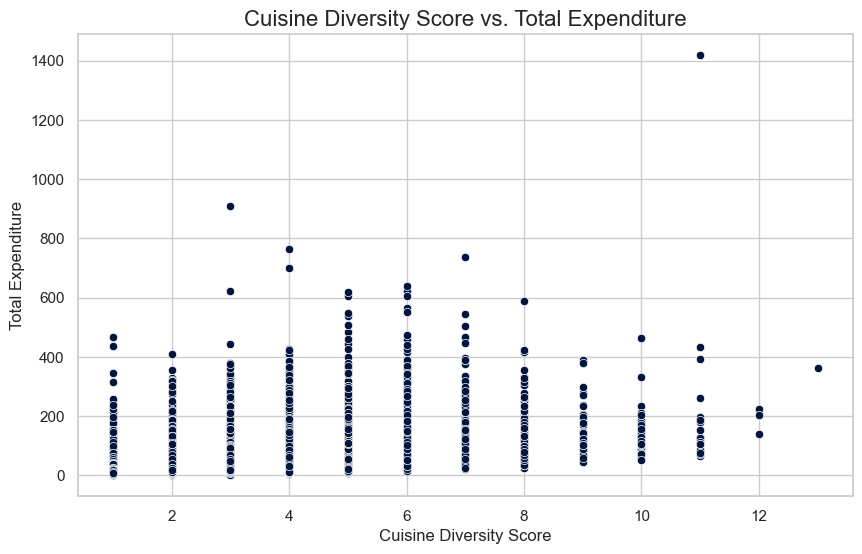

In [371]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data2, x='CUI_diversity_score', y='total_spending',color='#01153E')
plt.title('Cuisine Diversity Score vs. Total Expenditure', fontsize=16)
plt.xlabel('Cuisine Diversity Score')
plt.ylabel('Total Expenditure')
plt.show()

Customers with a high diversity of cuisine preferences don’t necessarily have higher expenditures. In fact, we can check that customers with low and mid-level diversity scores appear to have a similar range of total spending. This goes accordingly with previous findings.

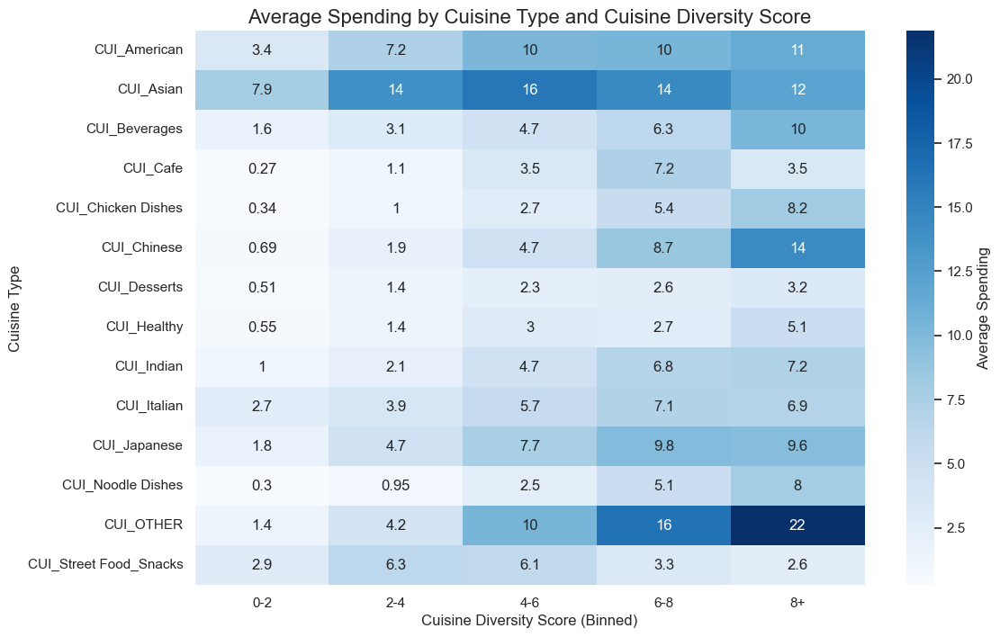

In [372]:
data2['CUI_diversity_bins'] = pd.cut(data2['CUI_diversity_score'], bins=[0, 2, 4, 6, 8, 10], labels=['0-2', '2-4', '4-6', '6-8', '8+'])

average_spending = data2.groupby('CUI_diversity_bins')[cuisine_columns].mean()

plt.figure(figsize=(12, 8))
sns.heatmap(average_spending.T, annot=True, cmap='Blues', cbar_kws={'label': 'Average Spending'})
plt.title('Average Spending by Cuisine Type and Cuisine Diversity Score', fontsize=16)
plt.xlabel('Cuisine Diversity Score (Binned)')
plt.ylabel('Cuisine Type')
plt.show()


Across all diversity score ranges (that are organized in bins of range 2), CUI_Asian, CUI_American and CUI_OTHER have some of the highest average spending. This suggests that these cuisines are popular among customers, regardless of their level of cuisine diversity (specially american and asian). 

Customers with low diversity score tend to have a clear preference for Asian Cuisine.

The Chinese, Asian and Other cuisines show higher spending proportions for customers with higher diversity scores.

More diverse customers don't spend much in Cafe, Desserts and Street Food/Snacks cuisines.

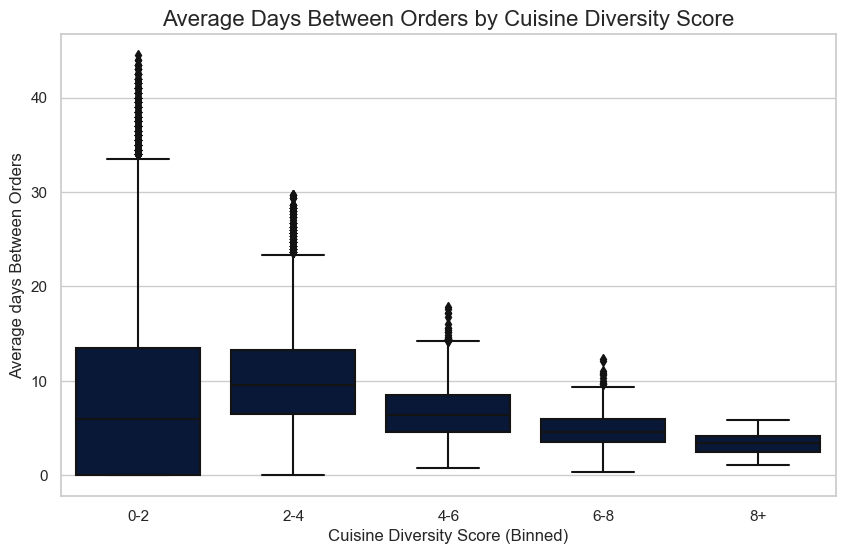

In [373]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='CUI_diversity_bins', y='order_frequency', data=data2, color='#01153E')
plt.title('Average Days Between Orders by Cuisine Diversity Score', fontsize=16)
plt.xlabel('Cuisine Diversity Score (Binned)')
plt.ylabel('Average days Between Orders')
plt.show()

As the diversity score increases, the median and the spread of the days between orders placed decrease, overall. 
This shows that customers with a higher diversity score are generally active on the platform, which makes sense.

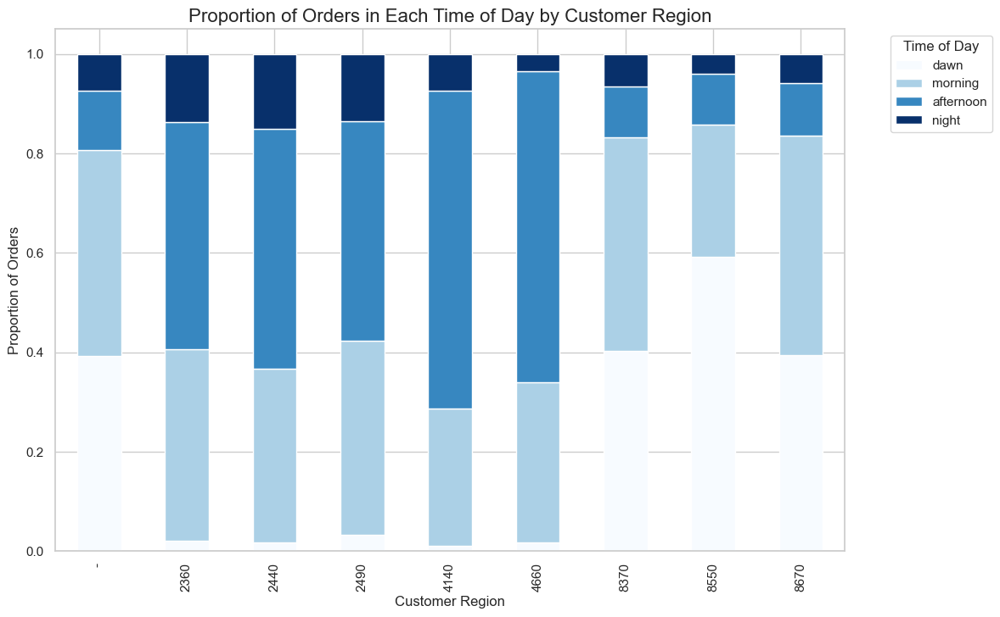

In [374]:
# This visualization was generated with the help of chat GPT
region_time_data = data2.groupby('customer_region')[time_columns].sum()

region_time_data_proportion = region_time_data.div(region_time_data.sum(axis=1), axis=0)

region_time_data_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='Blues')
plt.title('Proportion of Orders in Each Time of Day by Customer Region', fontsize=16)
plt.xlabel('Customer Region')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of Day', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

We can see that customer preferences for order timing vary between regions. In fact, the region '-' has a similar behaviour to the broader region 8 when it comes to the order timing.<br>
The broader regions do help to distinguish customers for different preferences in the time of day they order as we can see below.
Region 8 orders by dawn significantly more often than the other regions.

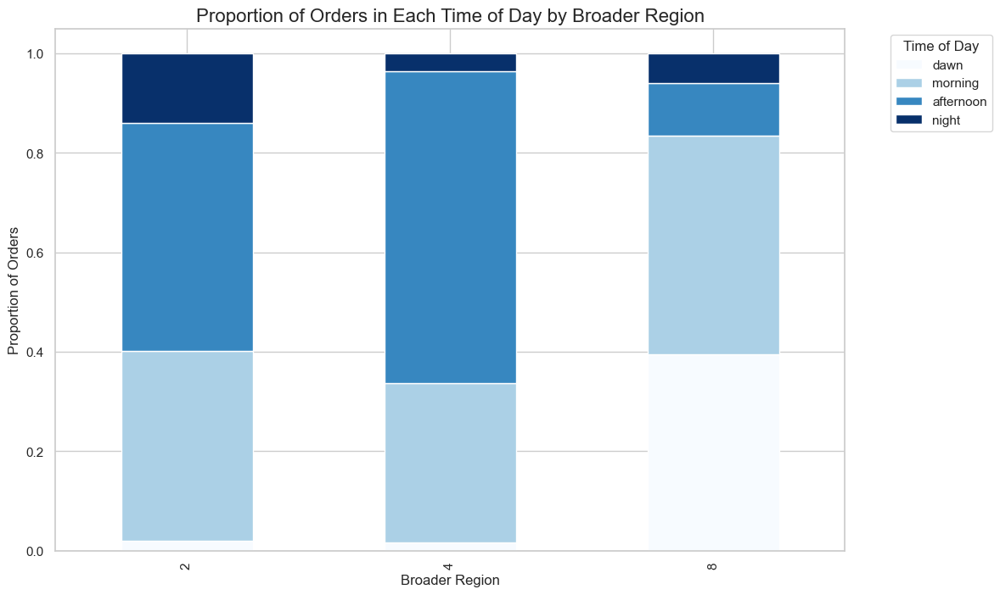

In [375]:
region_time_data = data2.groupby('broader_region')[time_columns].sum()

region_time_data_proportion = region_time_data.div(region_time_data.sum(axis=1), axis=0)

region_time_data_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='Blues')
plt.title('Proportion of Orders in Each Time of Day by Broader Region', fontsize=16)
plt.xlabel('Broader Region')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of Day', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Here we group by broader region, and can confirm what was stated with the previous visualization.

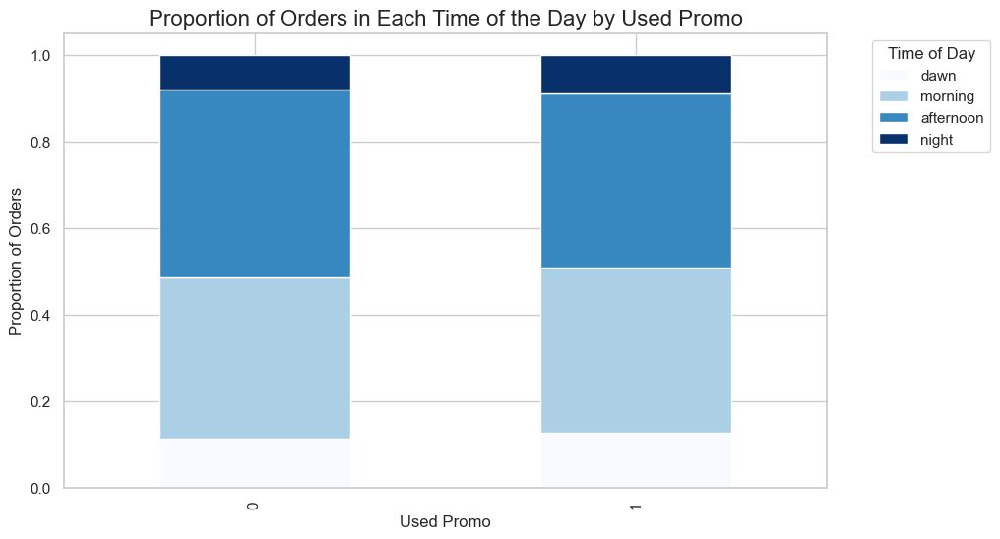

In [376]:
promo_time_data = data2.groupby('used_promo')[time_columns].sum()

promo_time_data_proportion = promo_time_data.div(promo_time_data.sum(axis=1), axis=0)

promo_time_data_proportion.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Blues')
plt.title('Proportion of Orders in Each Time of the Day by Used Promo', fontsize=16)
plt.xlabel('Used Promo')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of Day', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

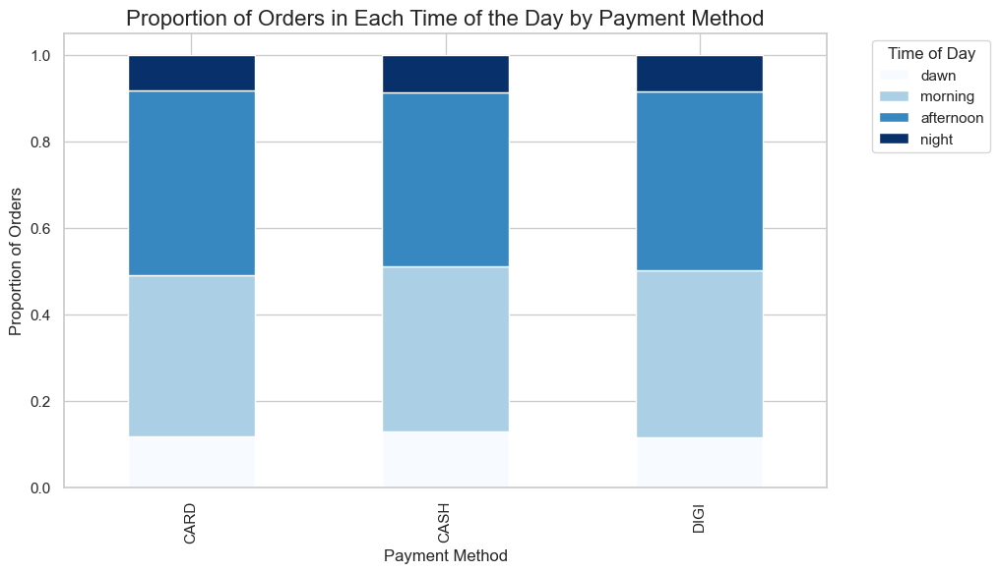

In [377]:
promo_time_data = data2.groupby('payment_method')[time_columns].sum()

promo_time_data_proportion = promo_time_data.div(promo_time_data.sum(axis=1), axis=0)

promo_time_data_proportion.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Blues')
plt.title('Proportion of Orders in Each Time of the Day by Payment Method', fontsize=16)
plt.xlabel('Payment Method')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of Day', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Contrary to what happens with the regions, the promotion usage and the payment method do not help in distinguish customers based on the time of day they order.

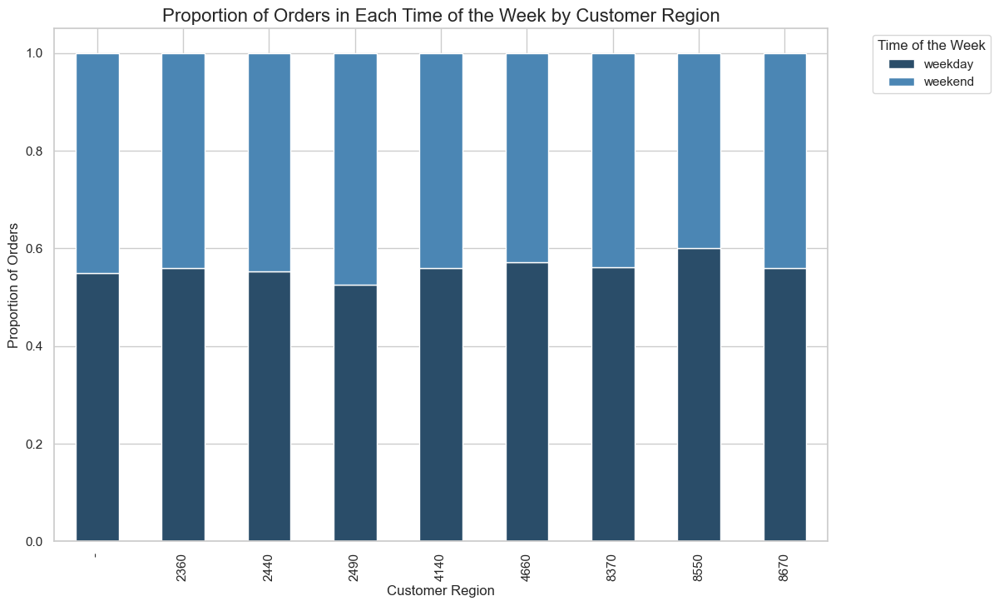

In [378]:
region_week_data = data2.groupby('customer_region')[week_columns].sum()

region_week_proportion = region_week_data.div(region_week_data.sum(axis=1), axis=0)

region_week_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), color=['#2a4d69', '#4b86b4'])
plt.title('Proportion of Orders in Each Time of the Week by Customer Region', fontsize=16)
plt.xlabel('Customer Region')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of the Week', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

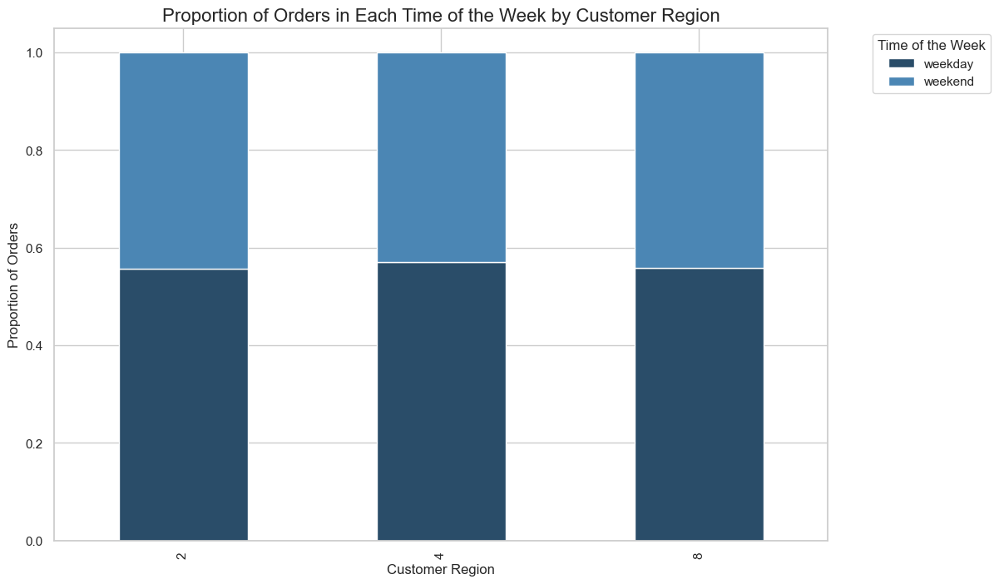

In [379]:
region_week_data = data2.groupby('broader_region')[week_columns].sum()

region_week_proportion = region_week_data.div(region_week_data.sum(axis=1), axis=0)

region_week_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), color=['#2a4d69', '#4b86b4'])
plt.title('Proportion of Orders in Each Time of the Week by Customer Region', fontsize=16)
plt.xlabel('Customer Region')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of the Week', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

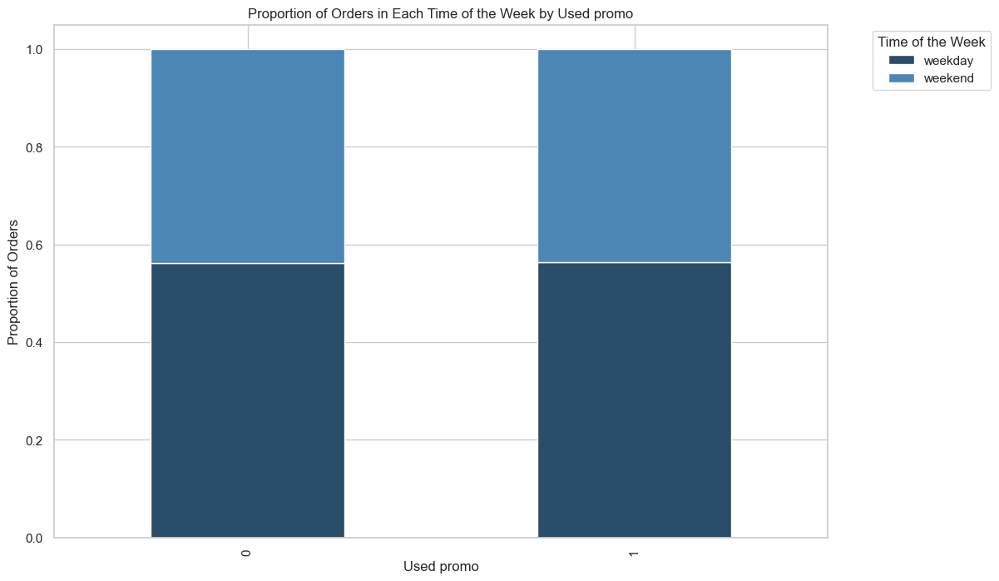

In [380]:
promo_week_data = data2.groupby('used_promo')[week_columns].sum()

promo_week_proportion = promo_week_data.div(promo_week_data.sum(axis=1), axis=0)

promo_week_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), color=['#2a4d69', '#4b86b4'])
plt.title('Proportion of Orders in Each Time of the Week by Used promo')
plt.xlabel('Used promo')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of the Week', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

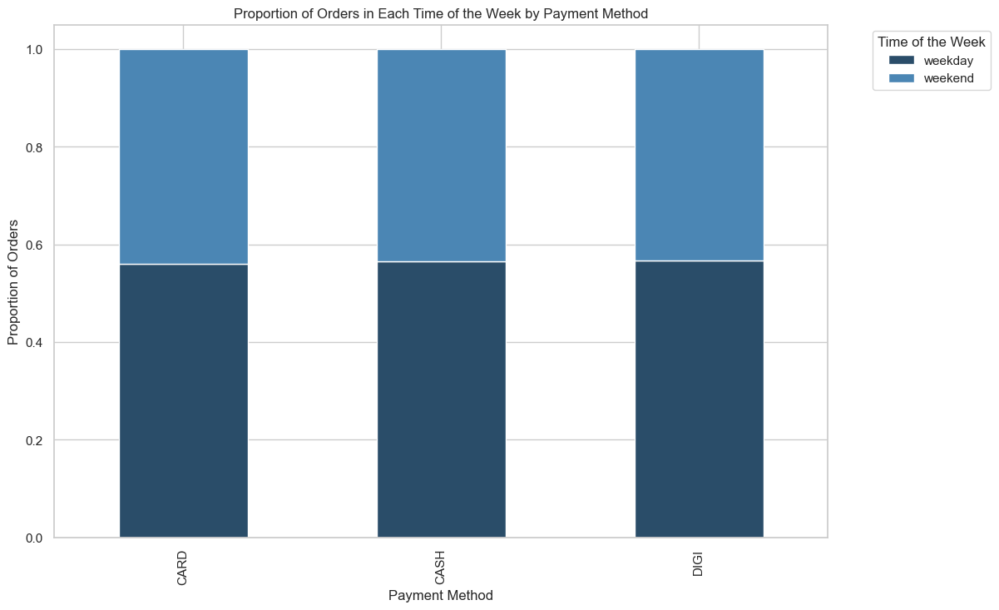

In [381]:
promo_week_data = data2.groupby('payment_method')[week_columns].sum()

promo_week_proportion = promo_week_data.div(promo_week_data.sum(axis=1), axis=0)

promo_week_proportion.plot(kind='bar', stacked=True, figsize=(12, 8), color=['#2a4d69', '#4b86b4'])
plt.title('Proportion of Orders in Each Time of the Week by Payment Method')
plt.xlabel('Payment Method')
plt.ylabel('Proportion of Orders')
plt.legend(title='Time of the Week', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Based on these visualizations, we can understand that last promo, customer region and payment method do not help to distinguish customers based on the time of the week they order.

## 5. FINAL CONCLUSIONS

We conclude with the EDA that we have a young customer base, highly segmented by cuisine expenditure and with spending patterns influenced by time of day and customer region. Our customers are either frequent or single users, with the majority having a low average of placed orders and products. However, a smaller group of high-frequency, high-spending customers emerges as outliers and are in fact a valuable segment. 

END